# Data Processing

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from get_stock_data_from_yfinance import pull_data_from_csv
from get_features_data import get_features_data
from get_labels_data import *
from simulate import *

In [2]:
from sklearn.decomposition import PCA, KernelPCA
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
# Get AAPL data features and labels
train_dates, train_vals = pull_data_from_csv("AAPL", "training_data")
train_data = get_features_data(train_vals)
train_labels_peak, _ = daily_peak_valley_labels(train_vals)
train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
train_data[np.isnan(train_data)] = 0

test_dates, test_vals = pull_data_from_csv("AAPL", "test_data")
test_data = get_features_data(test_vals)
test_labels_peak, _ = daily_peak_valley_labels(test_vals)
test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
buy_hold = np.ones((len(test_labels_peak),))
test_data[np.isnan(test_data)] = 0


num_train, num_feat = train_data.shape
pca = PCA(n_components=7)
train_data_pca = pca.fit_transform(train_data)
test_data_pca = pca.transform(test_data)

# Naive Bayes

Final Balance Buy-Hold: 1.2759445981341397


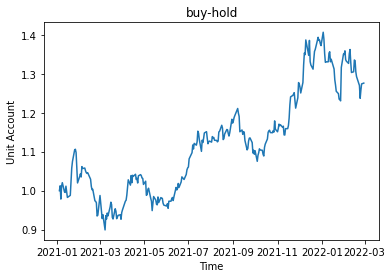

AAPL Peak Valley Accuracy: 0.5310344827586206
Final Balance Peak Valley: 1.2388783852693122


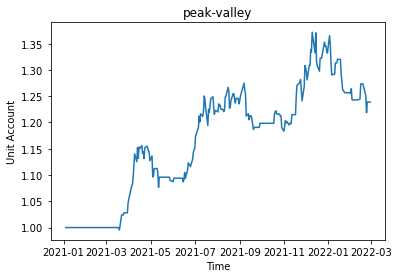

AAPL MA15 Accuracy: 0.7275862068965517
Final Balance MA15: 1.0920465718231007


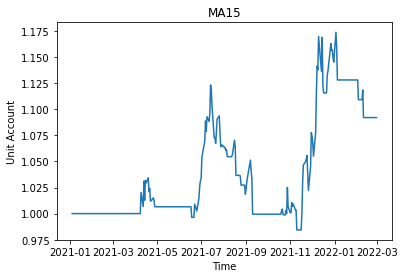

In [3]:
from sklearn.naive_bayes import GaussianNB
import sklearn.metrics as metrics
buy_hold_acct = simulate(test_vals, buy_hold)
print("Final Balance Buy-Hold:", buy_hold_acct[-1])
plot_account(test_dates, buy_hold_acct, "buy-hold")
gnb_peak = GaussianNB()
model_peak = gnb_peak.fit(train_data, train_labels_peak)
preds_peak = gnb_peak.predict(test_data)
print("AAPL Peak Valley Accuracy:", metrics.accuracy_score(test_labels_peak, preds_peak))
acct_peak = simulate(test_vals, preds_peak)
print("Final Balance Peak Valley:", acct_peak[-1])
plot_account(test_dates, acct_peak, "peak-valley")
gnb_MA15 = GaussianNB()
model_MA15 = gnb_MA15.fit(train_data, train_labels_MA15)
preds_MA15 = gnb_MA15.predict(test_data)
print("AAPL MA15 Accuracy:", metrics.accuracy_score(test_labels_MA15, preds_MA15))
acct_MA15 = simulate(test_vals, preds_MA15)
print("Final Balance MA15:", acct_MA15[-1])
plot_account(test_dates, acct_MA15, "MA15")

Final Balance Buy-Hold: 1.2759445981341397


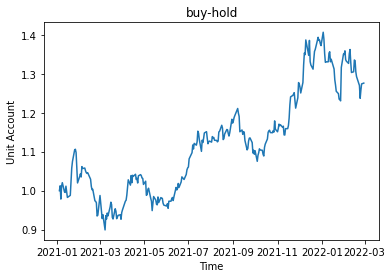

AAPL Peak Valley Accuracy: 0.5137931034482759
Final Balance Peak Valley: 1.2219343532206839


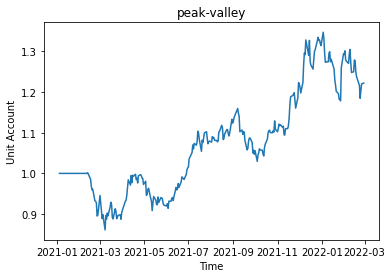

AAPL MA15 Accuracy: 0.6517241379310345
Final Balance MA15: 1.1925837659488778


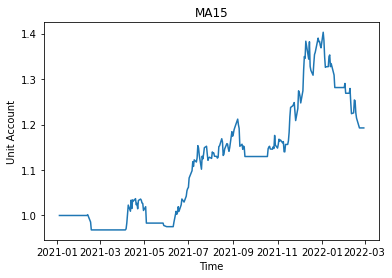

0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([24, 25, 26], dtype=int64),)
4 (array([23, 24, 26], dtype=int64),)
5 (array([32], dtype=int64),)
6 (array([ 3,  4,  7,  9, 10, 11, 12, 13, 15, 16, 17, 21, 37, 38],
      dtype=int64),)
[ 4.14318971e-05 -4.18527684e-03 -1.35120058e-03  9.34084546e-03
  1.11078408e-02 -2.22407286e-03  4.08201361e-04  7.32755990e-03
  3.42938986e-03  1.34121723e-02  1.66807459e-02  9.88599430e-03
  1.31418042e-02  3.26782879e-03  2.88116195e-03  9.55939815e-03
  6.33093573e-03  1.14577580e-02 -9.57319913e-04 -6.99623005e-04
  1.36571866e-05  8.95709379e-04 -8.66978710e-04 -2.30813862e-05
  6.75331236e-03 -6.40959205e-03  5.27777773e-03  1.38205640e-03
  1.45198026e-04 -5.77294488e-04  1.95935089e-03  7.22492514e-04
  9.99099528e-01  9.50969251e-05 -2.74691882e-03 -5.08737710e-03
 -1.75734728e-03  1.46472340e-02  1.02949590e-02 -2.84724305e-03]
[-1.91584026e-04  3.2

In [4]:
# PCA Data
buy_hold_acct = simulate(test_vals, buy_hold)
print("Final Balance Buy-Hold:", buy_hold_acct[-1])
plot_account(test_dates, buy_hold_acct, "buy-hold")
gnb_peak = GaussianNB()
model_peak = gnb_peak.fit(train_data_pca, train_labels_peak)
preds_peak = gnb_peak.predict(test_data_pca)
print("AAPL Peak Valley Accuracy:", metrics.accuracy_score(test_labels_peak, preds_peak))
acct_peak = simulate(test_vals, preds_peak)
print("Final Balance Peak Valley:", acct_peak[-1])
plot_account(test_dates, acct_peak, "peak-valley")
gnb_MA15 = GaussianNB()
model_MA15 = gnb_MA15.fit(train_data_pca, train_labels_MA15)
preds_MA15 = gnb_MA15.predict(test_data_pca)
print("AAPL MA15 Accuracy:", metrics.accuracy_score(test_labels_MA15, preds_MA15))
acct_MA15 = simulate(test_vals, preds_MA15)
print("Final Balance MA15:", acct_MA15[-1])
plot_account(test_dates, acct_MA15, "MA15")

for i in range(7):
    print(i, np.where(np.abs(pca.components_[i,:]) > 0.1))
print(pca.components_[5,:])
print(pca.components_[6,:])
print(np.max(np.abs(pca.components_[6,:])))

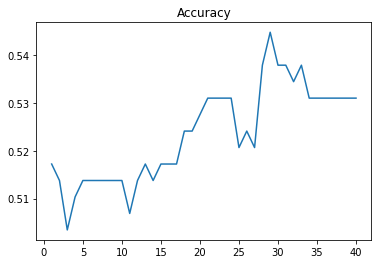

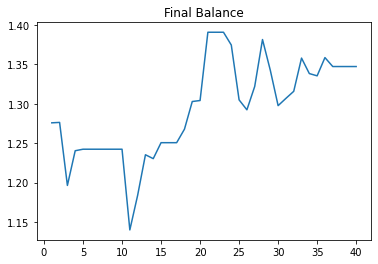

0.5448275862068965
28
1.342662223167424
1.3909350547214492


In [5]:
comp_list = list(range(1, num_feat+1))
accs = []
final_bal = []
for i in comp_list:
    pca = PCA(n_components=i)
    comb_data_pca = pca.fit_transform(comb_data)
    train_data_pca = comb_data_pca[:num_train,:]
    test_data_pca = comb_data_pca[num_train:,:]
    gnb_peak = GaussianNB()
    model_peak = gnb_peak.fit(train_data_pca, train_labels_peak)
    preds_peak = gnb_peak.predict(test_data_pca)
    acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
    acct_peak = simulate(test_vals, preds_peak)
    accs.append(acc_peak)
    final_bal.append(acct_peak[-1])
plt.plot(comp_list, accs)
plt.title("Accuracy")
plt.show()
plt.plot(comp_list, final_bal)
plt.title("Final Balance")
plt.show()
print(np.max(accs))
print(np.argmax(accs))
print(final_bal[np.argmax(accs)])
print(np.max(final_bal))

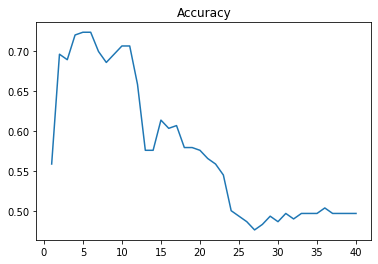

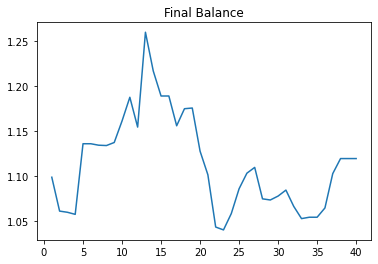

0.7241379310344828
4
1.1362508383323067
1.259937601130743


In [6]:
comp_list = list(range(1, num_feat+1))
accs = []
final_bal = []
for i in comp_list:
    pca = PCA(n_components=i)
    comb_data_pca = pca.fit_transform(comb_data)
    train_data_pca = comb_data_pca[:num_train,:]
    test_data_pca = comb_data_pca[num_train:,:]
    gnb_MA15 = GaussianNB()
    model_MA15 = gnb_MA15.fit(train_data_pca, train_labels_MA15)
    preds_MA15 = gnb_MA15.predict(test_data_pca)
    acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
    acct_MA15 = simulate(test_vals, preds_MA15)
    accs.append(acc_MA15)
    final_bal.append(acct_MA15[-1])
plt.plot(comp_list, accs)
plt.title("Accuracy")
plt.show()
plt.plot(comp_list, final_bal)
plt.title("Final Balance")
plt.show()
print(np.max(accs))
print(np.argmax(accs))
print(final_bal[np.argmax(accs)])
print(np.max(final_bal))

AAPL Peak Valley Accuracy 0.5137931034482759
Final Balance Peak Valley:  1.2424430324989704


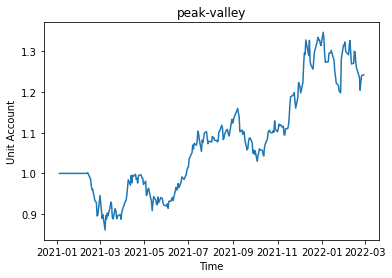

AAPL MA15 Accuracy 0.7
Final Balance MA15:  1.1346313359298652


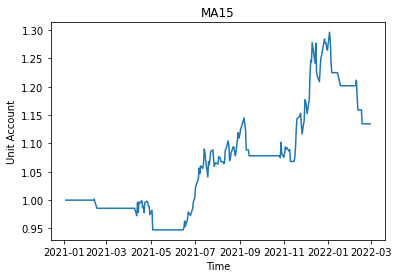

In [7]:
# kPCA Data
gnb_peak = GaussianNB()
model_peak = gnb_peak.fit(train_data_kpca, train_labels_peak)
preds_peak = gnb_peak.predict(test_data_kpca)
print("AAPL Peak Valley Accuracy", metrics.accuracy_score(test_labels_peak, preds_peak))
acct_peak = simulate(test_vals, preds_peak)
print("Final Balance Peak Valley: ", acct_peak[-1])
plot_account(test_dates, acct_peak, "peak-valley")
gnb_MA15 = GaussianNB()
model_MA15 = gnb_MA15.fit(train_data_kpca, train_labels_MA15)
preds_MA15 = gnb_MA15.predict(test_data_kpca)
print("AAPL MA15 Accuracy", metrics.accuracy_score(test_labels_MA15, preds_MA15))
acct_MA15 = simulate(test_vals, preds_MA15)
print("Final Balance MA15: ", acct_MA15[-1])
plot_account(test_dates, acct_MA15, "MA15")

AAPL Peak Valley Accuracy 0.5310344827586206
Final Balance Peak Valley:  1.2840371497813903


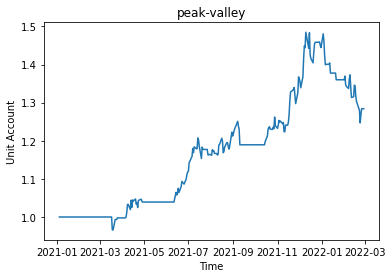

AAPL MA15 Accuracy 0.6448275862068965
Final Balance MA15:  1.1227908863839635


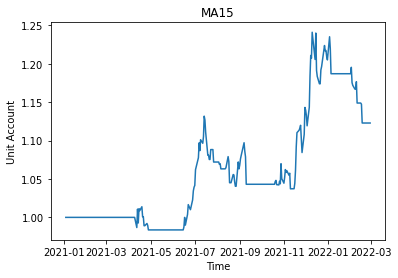

In [8]:
from sklearn.naive_bayes import BernoulliNB
bnb_peak = BernoulliNB()
model_peak = bnb_peak.fit(train_data, train_labels_peak)
preds_peak = bnb_peak.predict(test_data)
print("AAPL Peak Valley Accuracy", metrics.accuracy_score(test_labels_peak, preds_peak))
acct_peak = simulate(test_vals, preds_peak)
print("Final Balance Peak Valley: ", acct_peak[-1])
plot_account(test_dates, acct_peak, "peak-valley")
bnb_MA15 = BernoulliNB()
model_MA15 = bnb_MA15.fit(train_data, train_labels_MA15)
preds_MA15 = bnb_MA15.predict(test_data)
print("AAPL MA15 Accuracy", metrics.accuracy_score(test_labels_MA15, preds_MA15))
acct_MA15 = simulate(test_vals, preds_MA15)
print("Final Balance MA15: ", acct_MA15[-1])
plot_account(test_dates, acct_MA15, "MA15")

All stocks without PCA

AAPL Peak Valley Accuracy: 0.5310344827586206
AAPL Peak Valley Final Balance:  1.2388783852693122
AAPL MA15 Accuracy: 0.7275862068965517
AAPL MA15 Final Balance:  1.0920465718231007
ABBV Peak Valley Accuracy: 0.4724137931034483
ABBV Peak Valley Final Balance:  1.128866264788792
ABBV MA15 Accuracy: 0.696551724137931
ABBV MA15 Final Balance:  1.1036804502073716
ABT Peak Valley Accuracy: 0.506896551724138
ABT Peak Valley Final Balance:  1.1073962477286725
ABT MA15 Accuracy: 0.7448275862068966
ABT MA15 Final Balance:  1.0285175319872029
ACN Peak Valley Accuracy: 0.4793103448275862
ACN Peak Valley Final Balance:  0.9163892518900656
ACN MA15 Accuracy: 0.7310344827586207
ACN MA15 Final Balance:  1.358325743172403
ADBE Peak Valley Accuracy: 0.4724137931034483
ADBE Peak Valley Final Balance:  0.8306042358039472
ADBE MA15 Accuracy: 0.7965517241379311
ADBE MA15 Final Balance:  1.274099508877825
AMZN Peak Valley Accuracy: 0.5137931034482759
AMZN Peak Valley Final Balance:  1.0105922247556063
AMZN 

C:\Users\alist\AppData\Local\Temp\ipykernel_16052\732360416.py:75: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


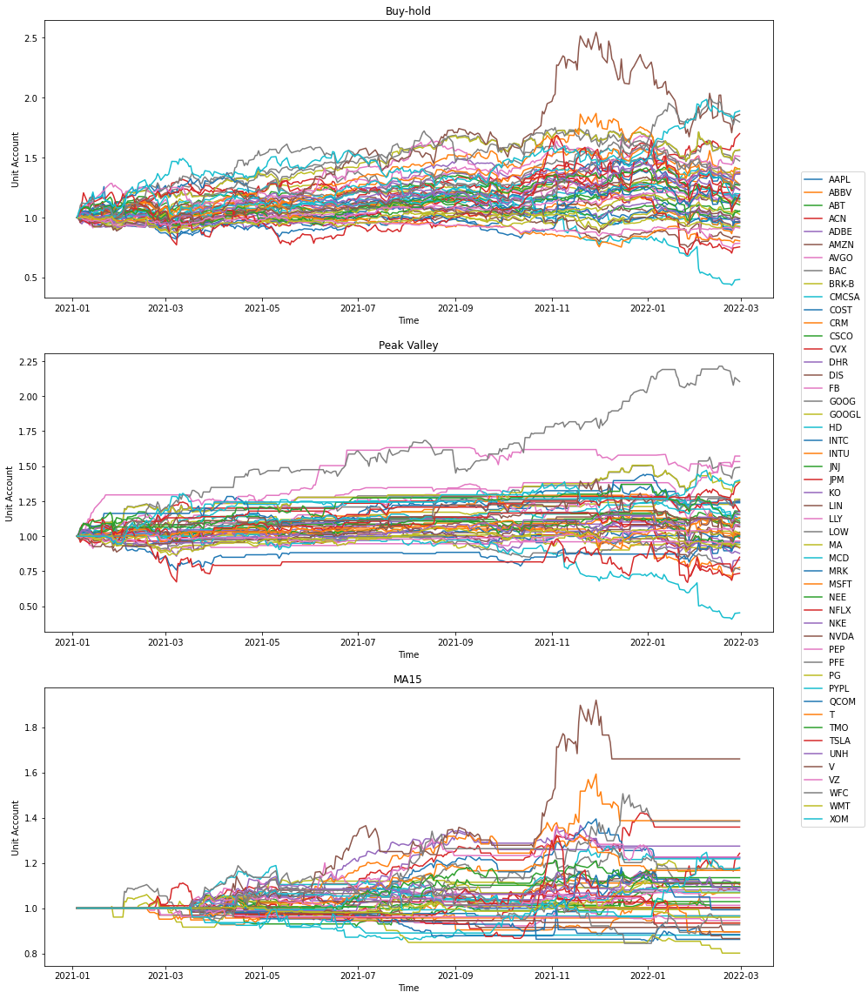

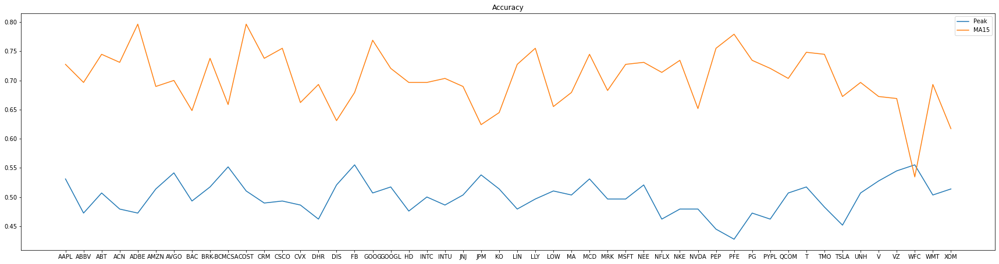

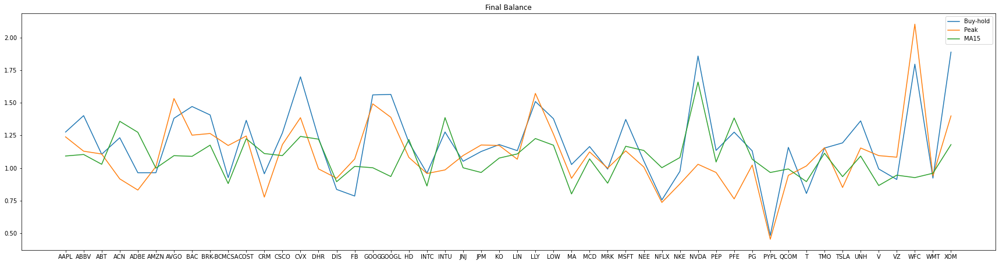

In [9]:
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
symbols = []
accuracy = np.zeros((len(csvs), 2))
final_bal = np.zeros((len(csvs), 3))
acc_peak_cnt = 0
acc_MA15_cnt = 0
acct_peak_cnt = 0
acct_MA15_cnt = 0
ind = 0
fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock training data features and labels
  train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
  train_data = get_features_data(train_vals)
  train_labels_peak, _ = daily_peak_valley_labels(train_vals)
  train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
  train_data[np.isnan(train_data)] = 0

  # Get stock test data features and labels
  test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
  test_data = get_features_data(test_vals)
  test_labels_peak, _ = daily_peak_valley_labels(test_vals)
  test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
  test_data[np.isnan(test_data)] = 0

  # Buy-hold
  buy_hold = np.ones((len(test_labels_peak),))
  buy_hold_acct = simulate(test_vals, buy_hold)
  axB.plot(test_dates, buy_hold_acct, label=symbol)

  # Train with Gaussian NB
  gnb_peak = GaussianNB()
  model_peak = gnb_peak.fit(train_data, train_labels_peak)
  preds_peak = gnb_peak.predict(test_data)
  acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
  print(symbol, "Peak Valley Accuracy:", acc_peak)
  acct_peak = simulate(test_vals, preds_peak)
  print(symbol, "Peak Valley Final Balance: ", acct_peak[-1])

  gnb_MA15 = GaussianNB()
  model_MA15 = gnb_MA15.fit(train_data, train_labels_MA15)
  preds_MA15 = gnb_MA15.predict(test_data)
  acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
  print(symbol, "MA15 Accuracy:", acc_MA15)
  acct_MA15 = simulate(test_vals, preds_MA15)
  print(symbol, "MA15 Final Balance: ", acct_MA15[-1])

  # Plot Account
  axP.plot(test_dates, acct_peak, label=symbol)
  axM.plot(test_dates, acct_MA15, label=symbol)

  # Update variables
  symbols.append(symbol)
  accuracy[ind,0] = acc_peak
  accuracy[ind,1] = acc_MA15
  final_bal[ind, 0] = acct_peak[-1]
  final_bal[ind, 1] = acct_MA15[-1]
  final_bal[ind, 2] = buy_hold_acct[-1]
  ind += 1
  acc_peak_cnt += acc_peak > acc_MA15
  acc_MA15_cnt += acc_MA15 > acc_peak
  acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
  acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
axB.set_title("Buy-hold")
axB.set_xlabel("Time")
axB.set_ylabel("Unit Account")
axP.set_title("Peak Valley")
axP.set_xlabel("Time")
axP.set_ylabel("Unit Account")
axM.set_title("MA15")
axM.set_xlabel("Time")
axM.set_ylabel("Unit Account")
fig.legend([axB, axP, axM], labels=symbols, loc="center right")

print("Higher Peak Accuracy Count: ", acc_peak_cnt)
print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
print("Higher Peak Final Balance Count: ", acct_peak_cnt)
print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
print("Avg Final Balance: [Peak, MA15] = ", np.mean(final_bal, axis=0))

# Plot accuracy and final balance of each stock
plt.figure(figsize=(30,7.5))
plt.plot(symbols, accuracy[:,0], label='Peak')
plt.plot(symbols, accuracy[:,1], label='MA15')
plt.legend()
plt.title("Accuracy")
plt.show()
plt.figure(figsize=(30,7.5))
plt.plot(symbols, final_bal[:,2], label='Buy-hold')
plt.plot(symbols, final_bal[:,0], label='Peak')
plt.plot(symbols, final_bal[:,1], label='MA15')
plt.legend()
plt.title("Final Balance")
plt.show()
  

All stocks with PCA (20 features)

AAPL Peak Valley Accuracy: 0.5241379310344828
AAPL Peak Valley Final Balance:  1.2443051378870997
AAPL MA15 Accuracy: 0.5137931034482759
AAPL MA15 Final Balance:  1.1481232996774855
ABBV Peak Valley Accuracy: 0.5344827586206896
ABBV Peak Valley Final Balance:  1.4933499062288371
ABBV MA15 Accuracy: 0.5724137931034483
ABBV MA15 Final Balance:  1.1791176378070545
ABT Peak Valley Accuracy: 0.5275862068965518
ABT Peak Valley Final Balance:  1.164465127458514
ABT MA15 Accuracy: 0.5103448275862069
ABT MA15 Final Balance:  1.07694359409633
ACN Peak Valley Accuracy: 0.506896551724138
ACN Peak Valley Final Balance:  1.1689849317841383
ACN MA15 Accuracy: 0.4896551724137931
ACN MA15 Final Balance:  1.023326002776358
ADBE Peak Valley Accuracy: 0.45517241379310347
ADBE Peak Valley Final Balance:  0.7102044947928192
ADBE MA15 Accuracy: 0.7275862068965517
ADBE MA15 Final Balance:  1.3530852852831166
AMZN Peak Valley Accuracy: 0.4724137931034483
AMZN Peak Valley Final Balance:  0.811399778906033
AMZN 

C:\Users\Viri4\AppData\Local\Temp/ipykernel_8128/1550121832.py:80: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


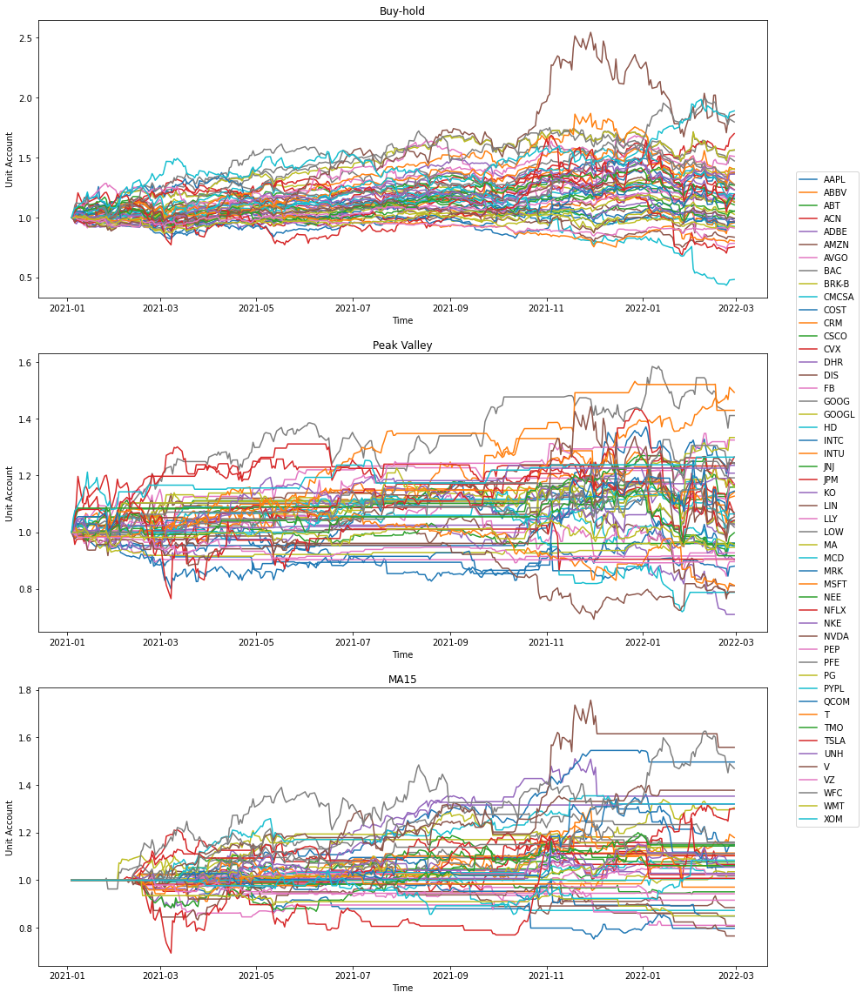

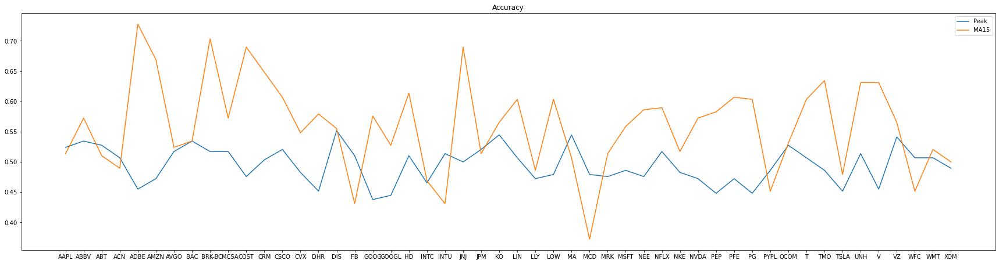

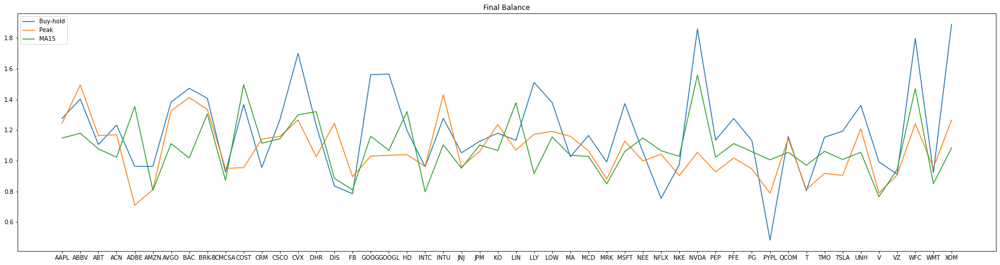

In [5]:
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
symbols = []
accuracy = np.zeros((len(csvs), 2))
final_bal = np.zeros((len(csvs), 3))
acc_peak_cnt = 0
acc_MA15_cnt = 0
acct_peak_cnt = 0
acct_MA15_cnt = 0
ind = 0
fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
axB.set_title("Buy-hold")
axB.set_xlabel("Time")
axB.set_ylabel("Unit Account")
axP.set_title("Peak Valley")
axP.set_xlabel("Time")
axP.set_ylabel("Unit Account")
axM.set_title("MA15")
axM.set_xlabel("Time")
axM.set_ylabel("Unit Account")
for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock training data features and labels
  train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
  train_data = get_features_data(train_vals)
  train_labels_peak, _ = daily_peak_valley_labels(train_vals)
  train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
  train_data[np.isnan(train_data)] = 0

  # Get stock test data features and labels
  test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
  test_data = get_features_data(test_vals)
  test_labels_peak, _ = daily_peak_valley_labels(test_vals)
  test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
  test_data[np.isnan(test_data)] = 0

  # Apply PCA to data and keep half of features
  pca = PCA(n_components=20)
  train_data_pca = pca.fit_transform(train_data)
  test_data_pca = pca.transform(test_data)

  # Buy-hold
  buy_hold = np.ones((len(test_labels_peak),))
  buy_hold_acct = simulate(test_vals, buy_hold)
  axB.plot(test_dates, buy_hold_acct, label=symbol)

  # Train with Gaussian NB
  gnb_peak = GaussianNB()
  model_peak = gnb_peak.fit(train_data_pca, train_labels_peak)
  preds_peak = gnb_peak.predict(test_data_pca)
  acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
  print(symbol, "Peak Valley Accuracy:", acc_peak)
  acct_peak = simulate(test_vals, preds_peak)
  print(symbol, "Peak Valley Final Balance: ", acct_peak[-1])

  gnb_MA15 = GaussianNB()
  model_MA15 = gnb_MA15.fit(train_data_pca, train_labels_MA15)
  preds_MA15 = gnb_MA15.predict(test_data_pca)
  acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
  print(symbol, "MA15 Accuracy:", acc_MA15)
  acct_MA15 = simulate(test_vals, preds_MA15)
  print(symbol, "MA15 Final Balance: ", acct_MA15[-1])

  # Plot Account
  axP.plot(test_dates, acct_peak, label=symbol)
  axM.plot(test_dates, acct_MA15, label=symbol)

  # Update variables
  symbols.append(symbol)
  accuracy[ind,0] = acc_peak
  accuracy[ind,1] = acc_MA15
  final_bal[ind, 0] = acct_peak[-1]
  final_bal[ind, 1] = acct_MA15[-1]
  final_bal[ind, 2] = buy_hold_acct[-1]
  ind += 1
  acc_peak_cnt += acc_peak > acc_MA15
  acc_MA15_cnt += acc_MA15 > acc_peak
  acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
  acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
fig.legend([axB, axP, axM], labels=symbols, loc="center right")

print("Higher Peak Accuracy Count: ", acc_peak_cnt)
print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
print("Higher Peak Final Balance Count: ", acct_peak_cnt)
print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
print("Avg Final Balance: [Peak, MA15] = ", np.mean(final_bal, axis=0))
plt.figure(figsize=(30,7.5))
plt.plot(symbols, accuracy[:,0], label='Peak')
plt.plot(symbols, accuracy[:,1], label='MA15')
plt.legend()
plt.title("Accuracy")
plt.show()
plt.figure(figsize=(30,7.5))
plt.plot(symbols, final_bal[:,2], label='Buy-hold')
plt.plot(symbols, final_bal[:,0], label='Peak')
plt.plot(symbols, final_bal[:,1], label='MA15')
plt.legend()
plt.title("Final Balance")
plt.show()
  

Try different number of components for PCA

C:\Users\Viri4\AppData\Local\Temp/ipykernel_2096/1549912449.py:15: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")


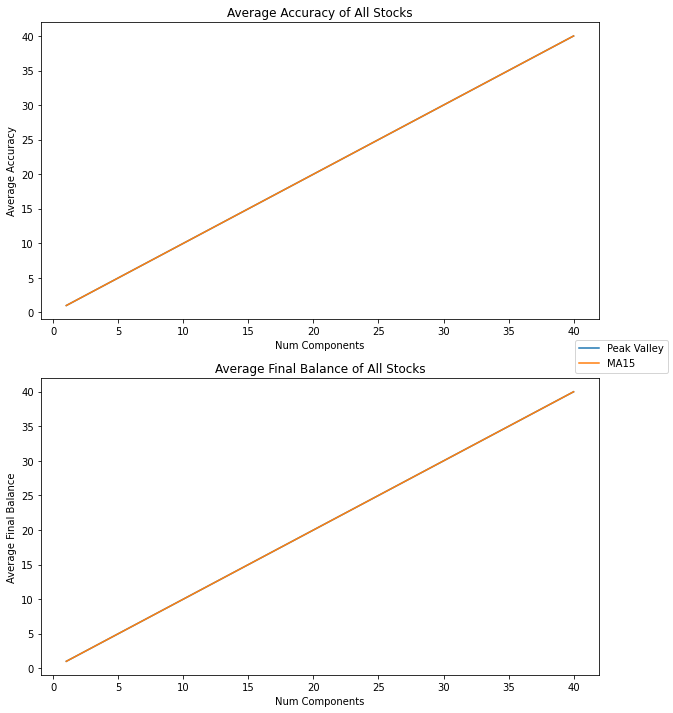

In [18]:
comp_list = list(range(1, 41))

fig, (ax_acc, ax_final_bal) = plt.subplots(2,1, figsize=(10,12))
ax_acc.plot(comp_list, comp_list, label="Peak Valley")
ax_acc.plot(comp_list, comp_list, label="MA15")
ax_acc.set_title("Average Accuracy of All Stocks")
ax_acc.set_xlabel("Num Components")
ax_acc.set_ylabel("Average Accuracy")

ax_final_bal.plot(comp_list, comp_list, label="Peak Valley")
ax_final_bal.plot(comp_list, comp_list, label="MA15")
ax_final_bal.set_title("Average Final Balance of All Stocks")
ax_final_bal.set_xlabel("Num Components")
ax_final_bal.set_ylabel("Average Final Balance")
fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")

C:\Users\Viri4\AppData\Local\Temp/ipykernel_8128/639060881.py:89: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")


4


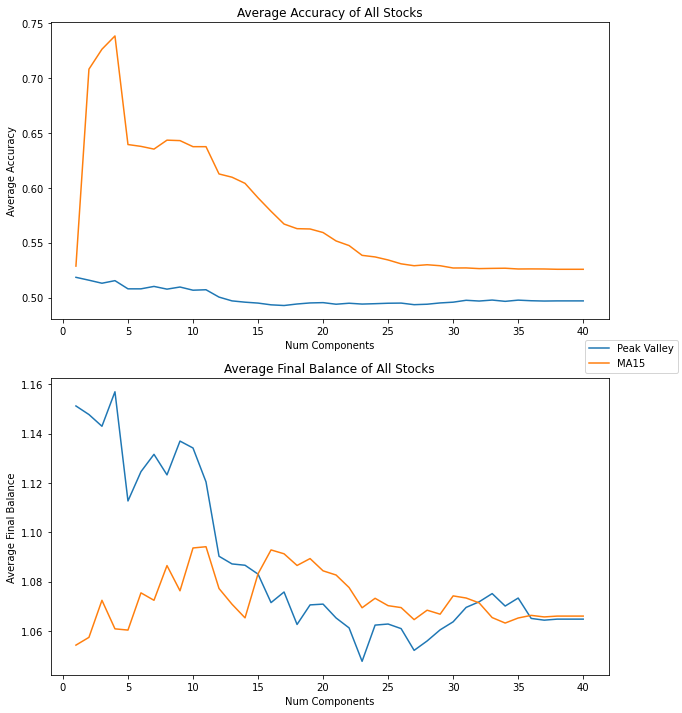

In [6]:
import glob
comp_list = list(range(1, 41))
peak_avg_accs = []
peak_avg_final_bal = []
MA15_avg_accs = []
MA15_avg_final_bal = []
csvs = glob.glob('stock_data/training_data/*.csv')
csvs.sort()
for i in comp_list:
  symbols = []
  accuracy = np.zeros((len(csvs), 2))
  final_bal = np.zeros((len(csvs), 2))
  acc_peak_cnt = 0
  acc_MA15_cnt = 0
  final_bal_peak_cnt = 0
  final_bal_MA15_cnt = 0
  ind = 0
  for csv in csvs:
    symbol = csv[csv.rindex('\\') + 1:-4]
    # Get stock training data features and labels
    train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
    train_data = get_features_data(train_vals)
    train_labels_peak, _ = daily_peak_valley_labels(train_vals)
    train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
    train_data[np.isnan(train_data)] = 0

    # Get stock test data features and labels
    test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
    test_data = get_features_data(test_vals)
    test_labels_peak, _ = daily_peak_valley_labels(test_vals)
    test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
    test_data[np.isnan(test_data)] = 0

    # Apply PCA to data and keep half of features
    pca = PCA(n_components=i)
    train_data_pca = pca.fit_transform(train_data)
    test_data_pca = pca.transform(test_data)

    # Train with Gaussian NB
    gnb_peak = GaussianNB()
    model_peak = gnb_peak.fit(train_data_pca, train_labels_peak)
    preds_peak = gnb_peak.predict(test_data_pca)
    acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
    acct_peak = simulate(test_vals, preds_peak)

    gnb_MA15 = GaussianNB()
    model_MA15 = gnb_MA15.fit(train_data_pca, train_labels_MA15)
    preds_MA15 = gnb_MA15.predict(test_data_pca)
    acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
    acct_MA15 = simulate(test_vals, preds_MA15)

    # Update variables
    symbols.append(symbol)
    accuracy[ind,0] = acc_peak
    accuracy[ind,1] = acc_MA15
    final_bal[ind, 0] = acct_peak[-1]
    final_bal[ind, 1] = acct_MA15[-1]
    ind += 1
    acc_peak_cnt += acc_peak > acc_MA15
    acc_MA15_cnt += acc_MA15 > acc_peak
    final_bal_peak_cnt += acct_peak[-1] > acct_MA15[-1]
    final_bal_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
  # print("Num Components:", i)
  # print("Higher Peak Accuracy Count: ", acc_peak_cnt)
  # print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
  # print("Higher Peak Final Balance Count: ", final_bal_peak_cnt)
  # print("Higher MA15 Final Balance Count: ", final_bal_MA15_cnt)
  avg_accuracy = np.mean(accuracy, axis=0)
  # print("Avg Accuracy: [Peak, MA15] = ", avg_accuracy)
  avg_final_bal = np.mean(final_bal, axis=0)
  # print("Avg Final Balance: [Peak, MA15] = ", avg_final_bal)
  peak_avg_accs.append(avg_accuracy[0])
  peak_avg_final_bal.append(avg_final_bal[0])
  MA15_avg_accs.append(avg_accuracy[1])
  MA15_avg_final_bal.append(avg_final_bal[1])
  # print()
fig, (ax_acc, ax_final_bal) = plt.subplots(2,1, figsize=(10,12))
ax_acc.plot(comp_list, peak_avg_accs, label="Peak Valley")
ax_acc.plot(comp_list, MA15_avg_accs, label="MA15")
ax_acc.set_title("Average Accuracy of All Stocks")
ax_acc.set_xlabel("Num Components")
ax_acc.set_ylabel("Average Accuracy")

ax_final_bal.plot(comp_list, peak_avg_final_bal, label="Peak Valley")
ax_final_bal.plot(comp_list, MA15_avg_final_bal, label="MA15")
ax_final_bal.set_title("Average Final Balance of All Stocks")
ax_final_bal.set_xlabel("Num Components")
ax_final_bal.set_ylabel("Average Final Balance")
fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")

print(np.argmax(peak_avg_final_bal)+1)  

All stocks with PCA (4 components)

AAPL Peak Valley Accuracy: 0.496551724137931
AAPL Peak Valley Final Balance:  1.207073304010975
AAPL MA15 Accuracy: 0.7241379310344828
AAPL MA15 Final Balance:  1.1214735389387183
ABBV Peak Valley Accuracy: 0.5758620689655173
ABBV Peak Valley Final Balance:  1.4405708401660735
ABBV MA15 Accuracy: 0.6793103448275862
ABBV MA15 Final Balance:  1.0271392451255605
ABT Peak Valley Accuracy: 0.5310344827586206
ABT Peak Valley Final Balance:  1.0830167667170392
ABT MA15 Accuracy: 0.7724137931034483
ABT MA15 Final Balance:  1.0262606685762565
ACN Peak Valley Accuracy: 0.5482758620689655
ACN Peak Valley Final Balance:  1.2236059959362935
ACN MA15 Accuracy: 0.8448275862068966
ACN MA15 Final Balance:  1.3845361873497686
ADBE Peak Valley Accuracy: 0.4862068965517241
ADBE Peak Valley Final Balance:  0.8294617444587933
ADBE MA15 Accuracy: 0.7344827586206897
ADBE MA15 Final Balance:  1.114453097750615
AMZN Peak Valley Accuracy: 0.47586206896551725
AMZN Peak Valley Final Balance:  0.8870408333696852
AM

C:\Users\Viri4\AppData\Local\Temp/ipykernel_8128/3176940443.py:80: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


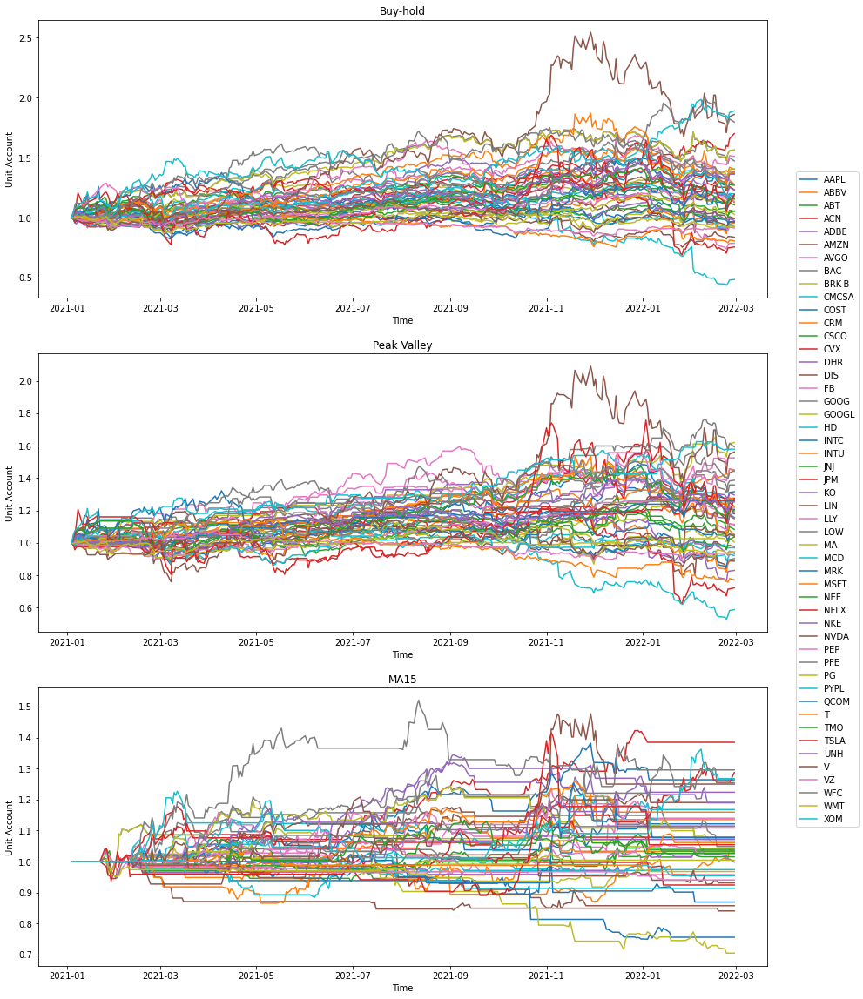

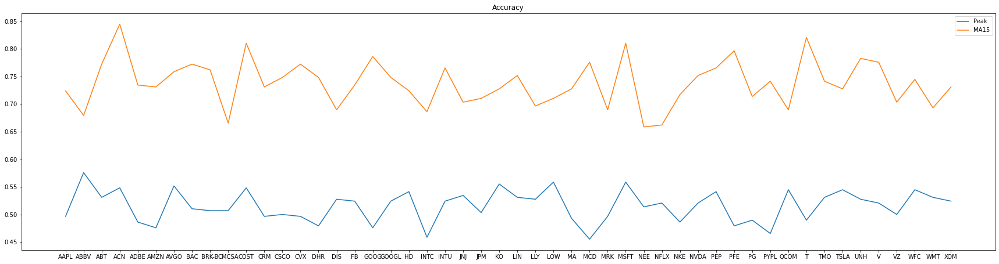

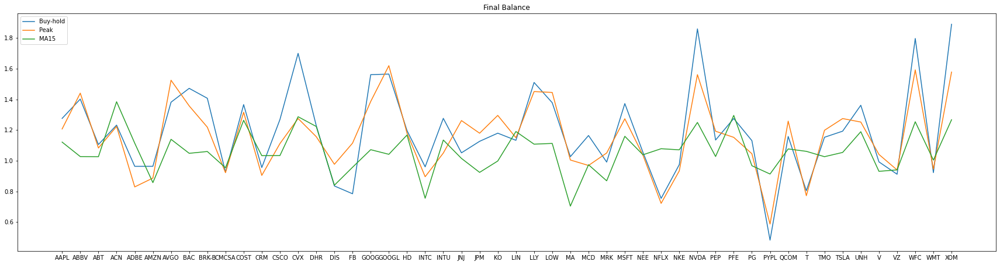

In [7]:
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
symbols = []
accuracy = np.zeros((len(csvs), 2))
final_bal = np.zeros((len(csvs), 3))
acc_peak_cnt = 0
acc_MA15_cnt = 0
acct_peak_cnt = 0
acct_MA15_cnt = 0
ind = 0
fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
axB.set_title("Buy-hold")
axB.set_xlabel("Time")
axB.set_ylabel("Unit Account")
axP.set_title("Peak Valley")
axP.set_xlabel("Time")
axP.set_ylabel("Unit Account")
axM.set_title("MA15")
axM.set_xlabel("Time")
axM.set_ylabel("Unit Account")
for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock training data features and labels
  train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
  train_data = get_features_data(train_vals)
  train_labels_peak, _ = daily_peak_valley_labels(train_vals)
  train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
  train_data[np.isnan(train_data)] = 0

  # Get stock test data features and labels
  test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
  test_data = get_features_data(test_vals)
  test_labels_peak, _ = daily_peak_valley_labels(test_vals)
  test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
  test_data[np.isnan(test_data)] = 0

  # Apply PCA to data and keep optimal number of features
  pca = PCA(n_components=4)
  train_data_pca = pca.fit_transform(train_data)
  test_data_pca = pca.transform(test_data)

  # Buy-hold
  buy_hold = np.ones((len(test_labels_peak),))
  buy_hold_acct = simulate(test_vals, buy_hold)
  axB.plot(test_dates, buy_hold_acct, label=symbol)

  # Train with Gaussian NB
  gnb_peak = GaussianNB()
  model_peak = gnb_peak.fit(train_data_pca, train_labels_peak)
  preds_peak = gnb_peak.predict(test_data_pca)
  acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
  print(symbol, "Peak Valley Accuracy:", acc_peak)
  acct_peak = simulate(test_vals, preds_peak)
  print(symbol, "Peak Valley Final Balance: ", acct_peak[-1])

  gnb_MA15 = GaussianNB()
  model_MA15 = gnb_MA15.fit(train_data_pca, train_labels_MA15)
  preds_MA15 = gnb_MA15.predict(test_data_pca)
  acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
  print(symbol, "MA15 Accuracy:", acc_MA15)
  acct_MA15 = simulate(test_vals, preds_MA15)
  print(symbol, "MA15 Final Balance: ", acct_MA15[-1])

  # Plot Account
  axP.plot(test_dates, acct_peak, label=symbol)
  axM.plot(test_dates, acct_MA15, label=symbol)

  # Update variables
  symbols.append(symbol)
  accuracy[ind,0] = acc_peak
  accuracy[ind,1] = acc_MA15
  final_bal[ind, 0] = acct_peak[-1]
  final_bal[ind, 1] = acct_MA15[-1]
  final_bal[ind, 2] = buy_hold_acct[-1]
  ind += 1
  acc_peak_cnt += acc_peak > acc_MA15
  acc_MA15_cnt += acc_MA15 > acc_peak
  acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
  acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
fig.legend([axB, axP, axM], labels=symbols, loc="center right")

print("Higher Peak Accuracy Count: ", acc_peak_cnt)
print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
print("Higher Peak Final Balance Count: ", acct_peak_cnt)
print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
print("Avg Final Balance: [Peak, MA15, Buy-hold] = ", np.mean(final_bal, axis=0))
plt.figure(figsize=(30,7.5))
plt.plot(symbols, accuracy[:,0], label='Peak')
plt.plot(symbols, accuracy[:,1], label='MA15')
plt.legend()
plt.title("Accuracy")
plt.show()
plt.figure(figsize=(30,7.5))
plt.plot(symbols, final_bal[:,2], label='Buy-hold')
plt.plot(symbols, final_bal[:,0], label='Peak')
plt.plot(symbols, final_bal[:,1], label='MA15')
plt.legend()
plt.title("Final Balance")
plt.show()

In [9]:
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock training data features and labels
  train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
  train_data = get_features_data(train_vals)
  train_labels_peak, _ = daily_peak_valley_labels(train_vals)
  train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
  train_data[np.isnan(train_data)] = 0

  # Get stock test data features and labels
  test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
  test_data = get_features_data(test_vals)
  test_labels_peak, _ = daily_peak_valley_labels(test_vals)
  test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
  test_data[np.isnan(test_data)] = 0

  # Apply PCA to data and keep half of features
  pca = PCA(n_components=4)
  train_data_pca = pca.fit_transform(train_data)
  test_data_pca = pca.transform(test_data)

  print(symbol)
  for i in range(4):
    print(i, np.where(np.abs(pca.components_[i,:]) > 0.1))
  print()

AAPL
0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([24, 25, 26], dtype=int64),)

ABBV
0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([22, 24, 25, 26], dtype=int64),)

ABT
0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([22, 24, 25, 26], dtype=int64),)

ACN
0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([22, 24, 25, 26], dtype=int64),)

ADBE
0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([22, 24, 25, 26], dtype=int64),)

AMZN
0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)

# Naive Bayes Trained with all stocks

In [4]:
# Combine stock data
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
comb_train_data = np.array([]).reshape(0,40)
comb_train_labels_peak = np.array([]).reshape(0,1)
comb_train_labels_MA15 = np.array([]).reshape(0,1)
for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock training data features and labels
  train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
  train_data = get_features_data(train_vals)
  train_labels_peak, _ = daily_peak_valley_labels(train_vals)
  train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
  train_data[np.isnan(train_data)] = 0
  comb_train_data = np.vstack((comb_train_data, train_data))
  comb_train_labels_peak = np.vstack((comb_train_labels_peak, np.reshape(train_labels_peak, (len(train_labels_peak), 1))))
  comb_train_labels_MA15 = np.vstack((comb_train_labels_MA15, np.reshape(train_labels_MA15, (len(train_labels_MA15), 1))))
comb_train_labels_peak = comb_train_labels_peak.ravel()
comb_train_labels_MA15 = comb_train_labels_MA15.ravel()
print(comb_train_data.shape)
print(comb_train_labels_peak.shape)
print(comb_train_labels_MA15.shape)

(100020, 40)
(100020,)
(100020,)


AAPL Peak Valley Accuracy: 0.496551724137931
AAPL Peak Valley Final Balance:  1.0965818864251338
AAPL MA15 Accuracy: 0.7344827586206897
AAPL MA15 Final Balance:  1.1914866938856012
ABBV Peak Valley Accuracy: 0.4862068965517241
ABBV Peak Valley Final Balance:  1.1695677092622527
ABBV MA15 Accuracy: 0.7172413793103448
ABBV MA15 Final Balance:  1.097339569559782
ABT Peak Valley Accuracy: 0.4827586206896552
ABT Peak Valley Final Balance:  0.9634832578041426
ABT MA15 Accuracy: 0.7413793103448276
ABT MA15 Final Balance:  1.0007340860154335
ACN Peak Valley Accuracy: 0.45517241379310347
ACN Peak Valley Final Balance:  0.9282823882708962
ACN MA15 Accuracy: 0.7620689655172413
ACN MA15 Final Balance:  1.3355128976457924
ADBE Peak Valley Accuracy: 0.4827586206896552
ADBE Peak Valley Final Balance:  0.8322063527710671
ADBE MA15 Accuracy: 0.7793103448275862
ADBE MA15 Final Balance:  1.1707993628890836
AMZN Peak Valley Accuracy: 0.496551724137931
AMZN Peak Valley Final Balance:  1.0780129607982794
AM

C:\Users\Viri4\AppData\Local\Temp/ipykernel_8128/1127675780.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


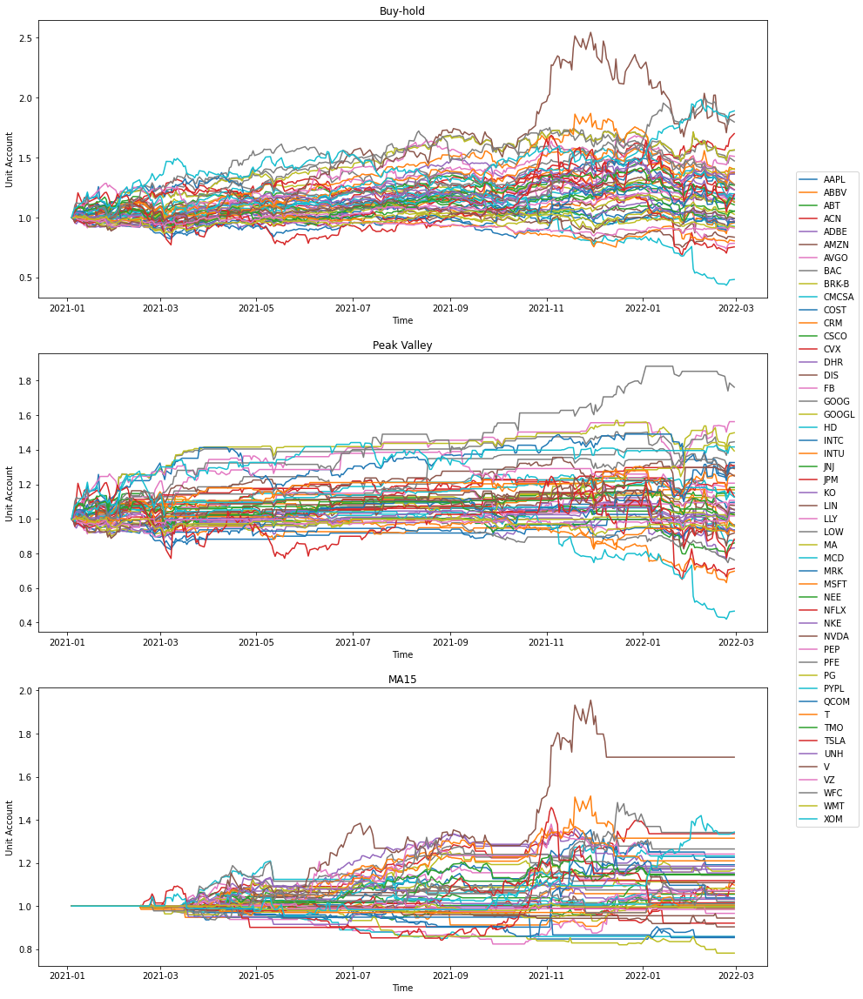

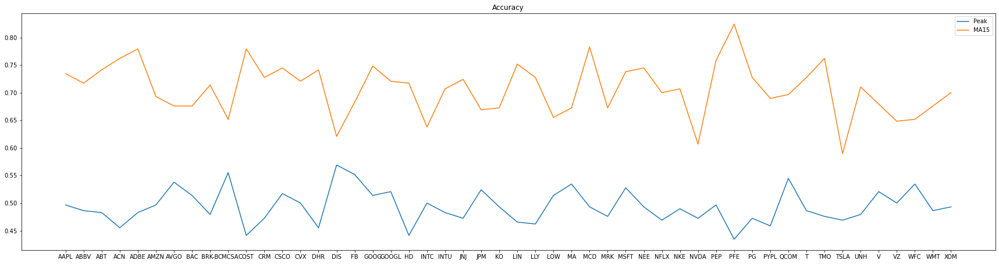

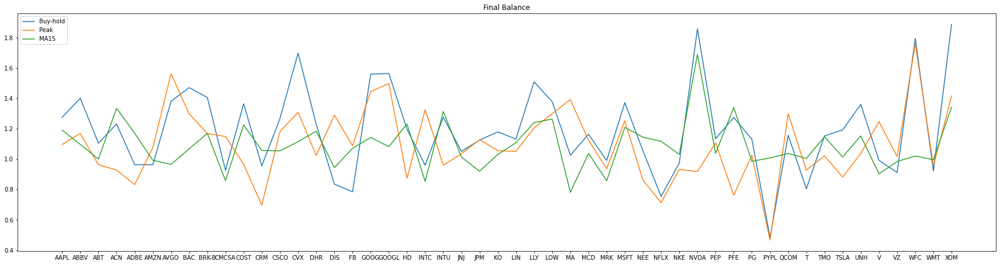

In [14]:
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
symbols = []
accuracy = np.zeros((len(csvs), 2))
final_bal = np.zeros((len(csvs), 3))
acc_peak_cnt = 0
acc_MA15_cnt = 0
acct_peak_cnt = 0
acct_MA15_cnt = 0
ind = 0
fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
axB.set_title("Buy-hold")
axB.set_xlabel("Time")
axB.set_ylabel("Unit Account")
axP.set_title("Peak Valley")
axP.set_xlabel("Time")
axP.set_ylabel("Unit Account")
axM.set_title("MA15")
axM.set_xlabel("Time")
axM.set_ylabel("Unit Account")

gnb_peak = GaussianNB()
model_peak = gnb_peak.fit(comb_train_data, comb_train_labels_peak)
gnb_MA15 = GaussianNB()
model_MA15 = gnb_MA15.fit(comb_train_data, comb_train_labels_MA15)

for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock test data features and labels
  test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
  test_data = get_features_data(test_vals)
  test_labels_peak, _ = daily_peak_valley_labels(test_vals)
  test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
  test_data[np.isnan(test_data)] = 0

  # Buy-hold
  buy_hold = np.ones((len(test_labels_peak),))
  buy_hold_acct = simulate(test_vals, buy_hold)
  axB.plot(test_dates, buy_hold_acct, label=symbol)

  # Train with Gaussian NB
  preds_peak = gnb_peak.predict(test_data)
  acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
  print(symbol, "Peak Valley Accuracy:", acc_peak)
  acct_peak = simulate(test_vals, preds_peak)
  print(symbol, "Peak Valley Final Balance: ", acct_peak[-1])

  preds_MA15 = gnb_MA15.predict(test_data)
  acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
  print(symbol, "MA15 Accuracy:", acc_MA15)
  acct_MA15 = simulate(test_vals, preds_MA15)
  print(symbol, "MA15 Final Balance: ", acct_MA15[-1])

  # Plot Account
  axP.plot(test_dates, acct_peak, label=symbol)
  axM.plot(test_dates, acct_MA15, label=symbol)

  # Update variables
  symbols.append(symbol)
  accuracy[ind,0] = acc_peak
  accuracy[ind,1] = acc_MA15
  final_bal[ind, 0] = acct_peak[-1]
  final_bal[ind, 1] = acct_MA15[-1]
  final_bal[ind, 2] = buy_hold_acct[-1]
  ind += 1
  acc_peak_cnt += acc_peak > acc_MA15
  acc_MA15_cnt += acc_MA15 > acc_peak
  acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
  acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
fig.legend([axB, axP, axM], labels=symbols, loc="center right")

print("Higher Peak Accuracy Count: ", acc_peak_cnt)
print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
print("Higher Peak Final Balance Count: ", acct_peak_cnt)
print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
print("Avg Final Balance: [Peak, MA15] = ", np.mean(final_bal, axis=0))
plt.figure(figsize=(30,7.5))
plt.plot(symbols, accuracy[:,0], label='Peak')
plt.plot(symbols, accuracy[:,1], label='MA15')
plt.legend()
plt.title("Accuracy")
plt.show()
plt.figure(figsize=(30,7.5))
plt.plot(symbols, final_bal[:,2], label='Buy-hold')
plt.plot(symbols, final_bal[:,0], label='Peak')
plt.plot(symbols, final_bal[:,1], label='MA15')
plt.legend()
plt.title("Final Balance")
plt.show()

C:\Users\Viri4\AppData\Local\Temp/ipykernel_8128/2136069507.py:84: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")


17


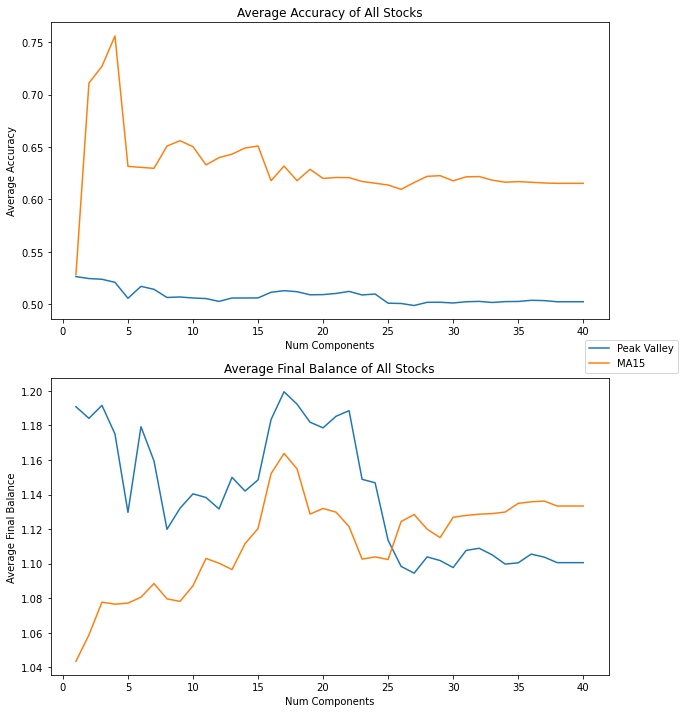

In [15]:
import glob
comp_list = list(range(1, 41))
peak_avg_accs = []
peak_avg_final_bal = []
MA15_avg_accs = []
MA15_avg_final_bal = []
csvs = glob.glob('stock_data/training_data/*.csv')
csvs.sort()
for i in comp_list:
  symbols = []
  accuracy = np.zeros((len(csvs), 2))
  final_bal = np.zeros((len(csvs), 2))
  acc_peak_cnt = 0
  acc_MA15_cnt = 0
  final_bal_peak_cnt = 0
  final_bal_MA15_cnt = 0
  ind = 0

  pca = PCA(n_components=i)
  comb_train_data_pca = pca.fit_transform(comb_train_data)
  gnb_peak = GaussianNB()
  model_peak = gnb_peak.fit(comb_train_data_pca, comb_train_labels_peak)
  gnb_MA15 = GaussianNB()
  model_MA15 = gnb_MA15.fit(comb_train_data_pca, comb_train_labels_MA15)
  for csv in csvs:
    symbol = csv[csv.rindex('\\') + 1:-4]

    # Get stock test data features and labels
    test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
    test_data = get_features_data(test_vals)
    test_labels_peak, _ = daily_peak_valley_labels(test_vals)
    test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
    test_data[np.isnan(test_data)] = 0

    # Apply PCA to data
    test_data_pca = pca.transform(test_data)

    # Train with Gaussian NB
    preds_peak = gnb_peak.predict(test_data_pca)
    acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
    acct_peak = simulate(test_vals, preds_peak)

    preds_MA15 = gnb_MA15.predict(test_data_pca)
    acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
    acct_MA15 = simulate(test_vals, preds_MA15)

    # Update variables
    symbols.append(symbol)
    accuracy[ind,0] = acc_peak
    accuracy[ind,1] = acc_MA15
    final_bal[ind, 0] = acct_peak[-1]
    final_bal[ind, 1] = acct_MA15[-1]
    ind += 1
    acc_peak_cnt += acc_peak > acc_MA15
    acc_MA15_cnt += acc_MA15 > acc_peak
    final_bal_peak_cnt += acct_peak[-1] > acct_MA15[-1]
    final_bal_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
  # print("Num Components:", i)
  # print("Higher Peak Accuracy Count: ", acc_peak_cnt)
  # print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
  # print("Higher Peak Final Balance Count: ", final_bal_peak_cnt)
  # print("Higher MA15 Final Balance Count: ", final_bal_MA15_cnt)
  avg_accuracy = np.mean(accuracy, axis=0)
  # print("Avg Accuracy: [Peak, MA15] = ", avg_accuracy)
  avg_final_bal = np.mean(final_bal, axis=0)
  # print("Avg Final Balance: [Peak, MA15] = ", avg_final_bal)
  peak_avg_accs.append(avg_accuracy[0])
  peak_avg_final_bal.append(avg_final_bal[0])
  MA15_avg_accs.append(avg_accuracy[1])
  MA15_avg_final_bal.append(avg_final_bal[1])
  # print()
fig, (ax_acc, ax_final_bal) = plt.subplots(2,1, figsize=(10,12))
ax_acc.plot(comp_list, peak_avg_accs, label="Peak Valley")
ax_acc.plot(comp_list, MA15_avg_accs, label="MA15")
ax_acc.set_title("Average Accuracy of All Stocks")
ax_acc.set_xlabel("Num Components")
ax_acc.set_ylabel("Average Accuracy")

ax_final_bal.plot(comp_list, peak_avg_final_bal, label="Peak Valley")
ax_final_bal.plot(comp_list, MA15_avg_final_bal, label="MA15")
ax_final_bal.set_title("Average Final Balance of All Stocks")
ax_final_bal.set_xlabel("Num Components")
ax_final_bal.set_ylabel("Average Final Balance")
fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")

print(np.argmax(peak_avg_final_bal)+1)  

PCA (17 components)

C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/3060375576.py:77: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  4
Higher MA15 Accuracy Count:  46
Higher Peak Final Balance Count:  34
Higher MA15 Final Balance Count:  16
Avg Accuracy: [Peak, MA15] =  [0.51289655 0.6317931 ]
Avg Final Balance: [Peak, MA15] =  [1.19950765 1.16381517 1.19225756]


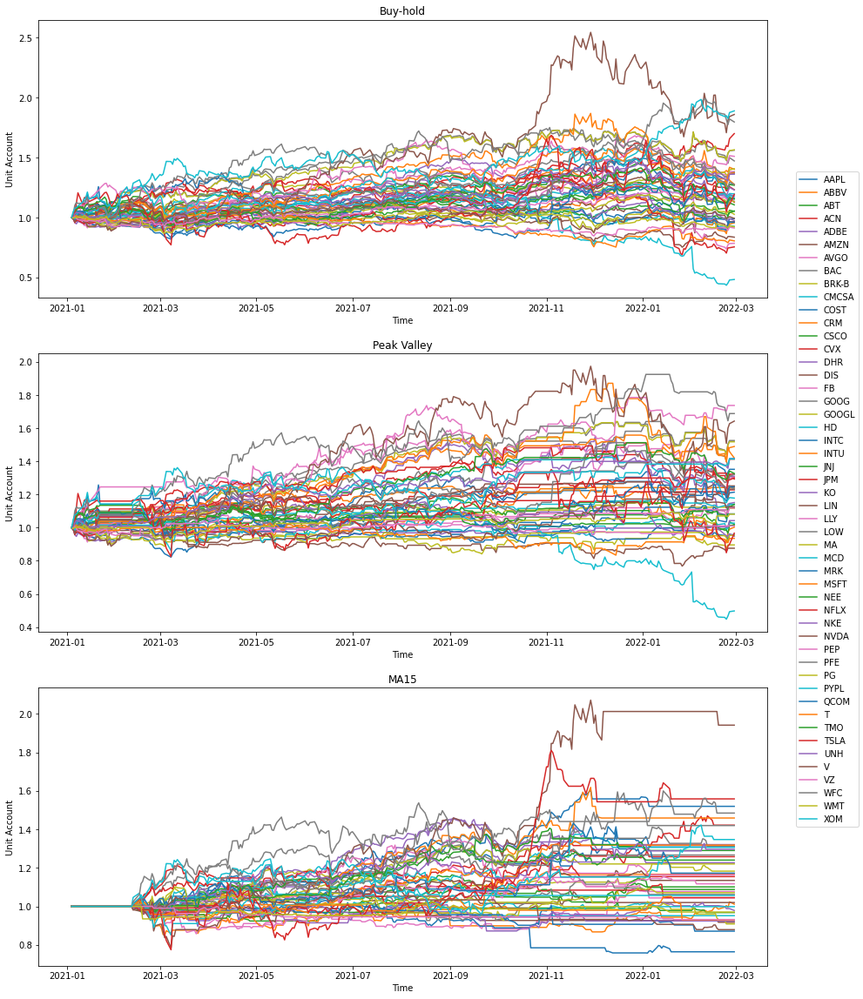

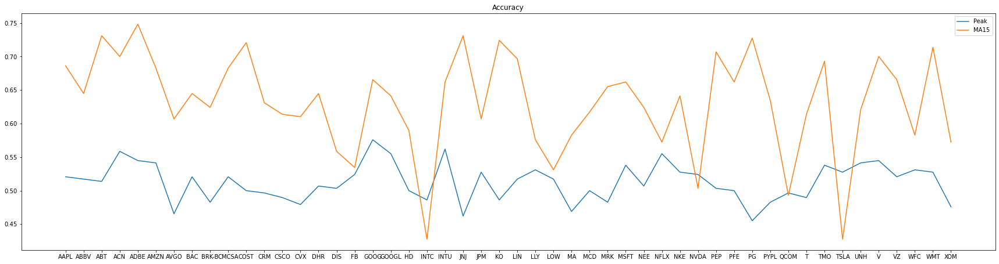

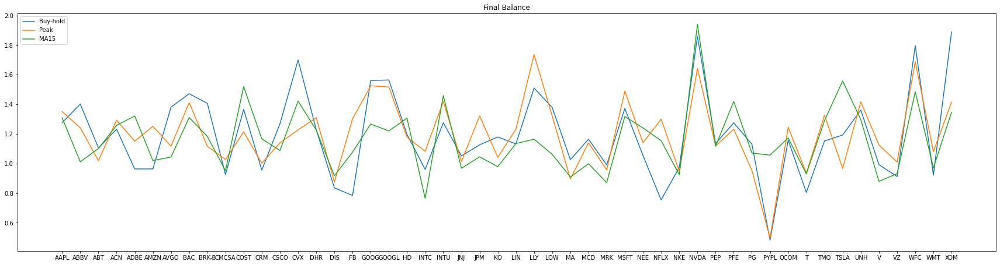

In [5]:
import glob
csvs = glob.glob('stock_data/training_data/*.csv')
max_final_bal = {}
symbols = []
accuracy = np.zeros((len(csvs), 2))
final_bal = np.zeros((len(csvs), 3))
acc_peak_cnt = 0
acc_MA15_cnt = 0
acct_peak_cnt = 0
acct_MA15_cnt = 0
ind = 0
fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
axB.set_title("Buy-hold")
axB.set_xlabel("Time")
axB.set_ylabel("Unit Account")
axP.set_title("Peak Valley")
axP.set_xlabel("Time")
axP.set_ylabel("Unit Account")
axM.set_title("MA15")
axM.set_xlabel("Time")
axM.set_ylabel("Unit Account")

pca = PCA(n_components=17)
comb_train_data_pca = pca.fit_transform(comb_train_data)
gnb_peak = GaussianNB()
model_peak = gnb_peak.fit(comb_train_data_pca, comb_train_labels_peak)
gnb_MA15 = GaussianNB()
model_MA15 = gnb_MA15.fit(comb_train_data_pca, comb_train_labels_MA15)

for csv in csvs:
  symbol = csv[csv.rindex('\\') + 1:-4]
  # Get stock test data features and labels
  test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
  test_data = get_features_data(test_vals)
  test_labels_peak, _ = daily_peak_valley_labels(test_vals)
  test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
  test_data[np.isnan(test_data)] = 0

  # Apply PCA to data
  test_data_pca = pca.transform(test_data)

  # Buy-hold
  buy_hold = np.ones((len(test_labels_peak),))
  buy_hold_acct = simulate(test_vals, buy_hold)
  axB.plot(test_dates, buy_hold_acct, label=symbol)

  # Train with Gaussian NB
  preds_peak = gnb_peak.predict(test_data_pca)
  acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
  # print(symbol, "Peak Valley Accuracy:", acc_peak)
  acct_peak = simulate(test_vals, preds_peak)
  # print(symbol, "Peak Valley Final Balance: ", acct_peak[-1])

  preds_MA15 = gnb_MA15.predict(test_data_pca)
  acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
  # print(symbol, "MA15 Accuracy:", acc_MA15)
  acct_MA15 = simulate(test_vals, preds_MA15)
  # print(symbol, "MA15 Final Balance: ", acct_MA15[-1])

  # Plot Account
  axP.plot(test_dates, acct_peak, label=symbol)
  axM.plot(test_dates, acct_MA15, label=symbol)

  # Update variables
  symbols.append(symbol)
  accuracy[ind,0] = acc_peak
  accuracy[ind,1] = acc_MA15
  final_bal[ind, 0] = acct_peak[-1]
  final_bal[ind, 1] = acct_MA15[-1]
  final_bal[ind, 2] = buy_hold_acct[-1]
  max_final_bal[symbol] = final_bal[ind, 0:2]
  ind += 1
  acc_peak_cnt += acc_peak > acc_MA15
  acc_MA15_cnt += acc_MA15 > acc_peak
  acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
  acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]
fig.legend([axB, axP, axM], labels=symbols, loc="center right")

print("Higher Peak Accuracy Count: ", acc_peak_cnt)
print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
print("Higher Peak Final Balance Count: ", acct_peak_cnt)
print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
print("Avg Final Balance: [Peak, MA15] = ", np.mean(final_bal, axis=0))
plt.figure(figsize=(30,7.5))
plt.plot(symbols, accuracy[:,0], label='Peak')
plt.plot(symbols, accuracy[:,1], label='MA15')
plt.legend()
plt.title("Accuracy")
plt.show()
plt.figure(figsize=(30,7.5))
plt.plot(symbols, final_bal[:,2], label='Buy-hold')
plt.plot(symbols, final_bal[:,0], label='Peak')
plt.plot(symbols, final_bal[:,1], label='MA15')
plt.legend()
plt.title("Final Balance")
plt.show()

In [6]:
pca = PCA(n_components=17)
comb_train_data_pca = pca.fit_transform(comb_train_data)
for i in range(17):
    print(i, np.where(np.abs(pca.components_[i,:]) > 0.1))

0 (array([22, 23, 24, 25, 26], dtype=int64),)
1 (array([22, 23, 24, 25, 26], dtype=int64),)
2 (array([22, 23, 25, 26], dtype=int64),)
3 (array([22, 24, 25, 26], dtype=int64),)
4 (array([23, 24, 25, 26], dtype=int64),)
5 (array([32], dtype=int64),)
6 (array([ 3,  4,  7,  9, 10, 11, 12, 13, 15, 16, 17, 21, 37, 38],
      dtype=int64),)
7 (array([ 1,  2,  3,  5,  6,  7, 10, 12, 13, 14, 17, 19, 21, 34, 35, 36],
      dtype=int64),)
8 (array([ 1,  3,  4,  5,  8,  9, 11, 12, 13, 14, 15, 17, 34, 35, 37],
      dtype=int64),)
9 (array([ 0,  2,  3,  5,  8,  9, 11, 12, 14, 15, 33, 34, 35, 36, 37, 38, 39],
      dtype=int64),)
10 (array([ 3,  4,  7,  9, 10, 13, 15, 16, 17, 27, 28, 29, 34, 36, 37, 38],
      dtype=int64),)
11 (array([ 0,  1,  2,  3,  4,  8, 10, 11, 12, 17, 33, 34, 35, 36, 38],
      dtype=int64),)
12 (array([ 2,  4,  6,  7,  8,  9, 10, 12, 13, 14, 21, 27, 28, 29, 30, 33, 36],
      dtype=int64),)
13 (array([ 3,  4,  6,  7, 12, 13, 16, 17, 21, 27, 28, 29, 33, 37, 39],
      dtype=i

In [6]:
clusters = [['MA', 'AMZN', 'NEE', 'DHR', 'GOOG', 'UNH', 'MSFT', 'ACN', 'V', 'HD', 'COST', 'NKE', 'CRM', 'AVGO', 'AAPL', 'LOW', 'LLY', 'TMO', 'GOOGL'],
            ['CVX', 'KO', 'WFC'],
            ['BAC', 'ABT', 'ABBV', 'MCD', 'DIS', 'INTC', 'CSCO', 'JPM', 'CMCSA', 'QCOM', 'BRK-B', 'LIN'],
            ['XOM', 'T', 'VZ'],
            ['JNJ', 'PG', 'PFE', 'PEP', 'WMT', 'MRK'],
            ['TSLA', 'FB', 'NVDA', 'ADBE', 'INTU', 'NFLX']]
cluster_train_data = []
cluster_train_labels_peak = []
cluster_train_labels_MA15 = []

for stock_list in clusters:
    train_data_comb = np.array([]).reshape(0,40)
    train_labels_comb_peak = np.array([]).reshape(0,1)
    train_labels_comb_MA15 = np.array([]).reshape(0,1)
    for symbol in stock_list:
        # Get stock training data features and labels
        train_dates, train_vals = pull_data_from_csv(symbol, "training_data")
        train_data = get_features_data(train_vals)
        train_labels_peak, _ = daily_peak_valley_labels(train_vals)
        train_labels_MA15, _ = MA15_trend_analysis_labels(train_vals)
        train_data[np.isnan(train_data)] = 0
        train_data_comb = np.vstack((train_data_comb, train_data))
        train_labels_comb_peak = np.vstack((train_labels_comb_peak, np.reshape(train_labels_peak, (len(train_labels_peak), 1))))
        train_labels_comb_MA15 = np.vstack((train_labels_comb_MA15, np.reshape(train_labels_MA15, (len(train_labels_MA15), 1))))
    train_labels_comb_peak = train_labels_comb_peak.ravel()
    train_labels_comb_MA15 = train_labels_comb_MA15.ravel()
    cluster_train_data.append(train_data_comb)
    cluster_train_labels_peak.append(train_labels_comb_peak)
    cluster_train_labels_MA15.append(train_labels_comb_MA15)

Cluster  1


C:\Users\Viri4\AppData\Local\Temp/ipykernel_9108/1111688533.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  19
Higher Peak Final Balance Count:  8
Higher MA15 Final Balance Count:  11
Avg Accuracy: [Peak, MA15] =  [0.5        0.71869328]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.12055809 1.12632436 1.23951547]


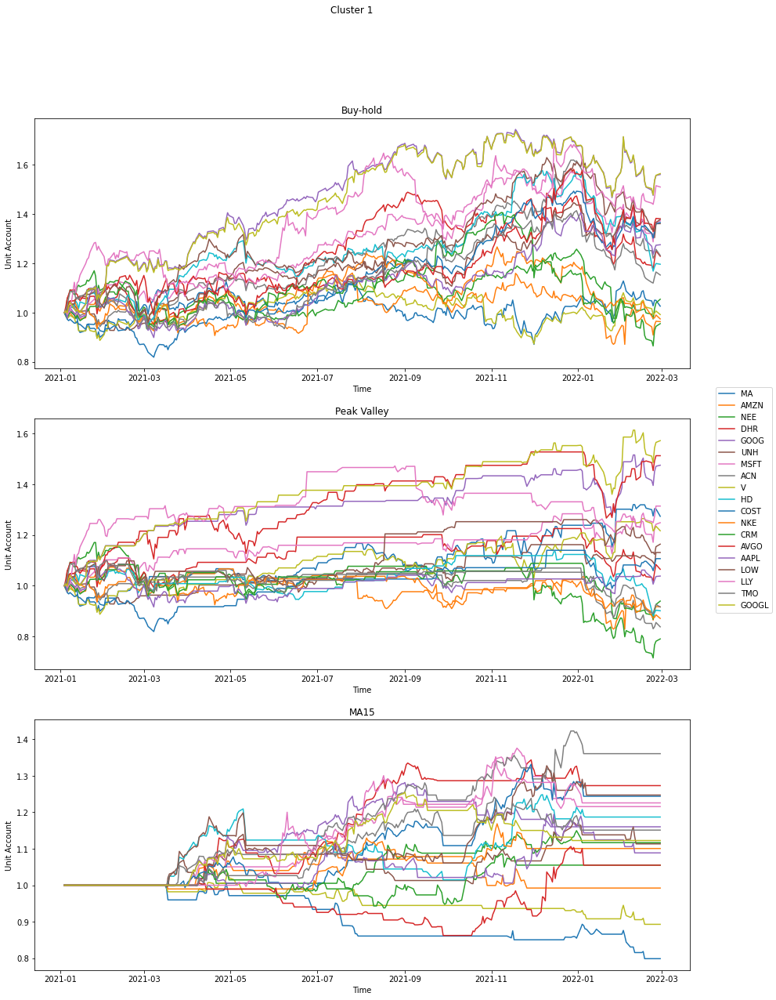

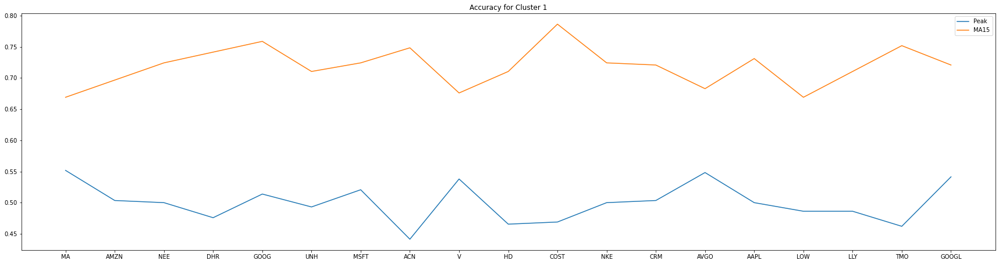

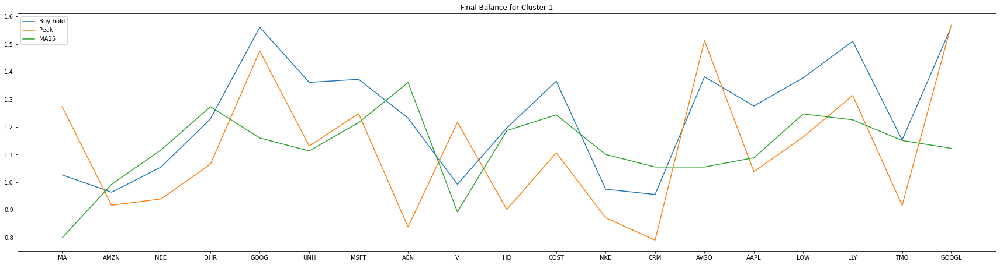

Cluster  2


C:\Users\Viri4\AppData\Local\Temp/ipykernel_9108/1111688533.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  3
Higher Peak Final Balance Count:  2
Higher MA15 Final Balance Count:  1
Avg Accuracy: [Peak, MA15] =  [0.47816092 0.59655172]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.29262168 1.06721071 1.55885621]


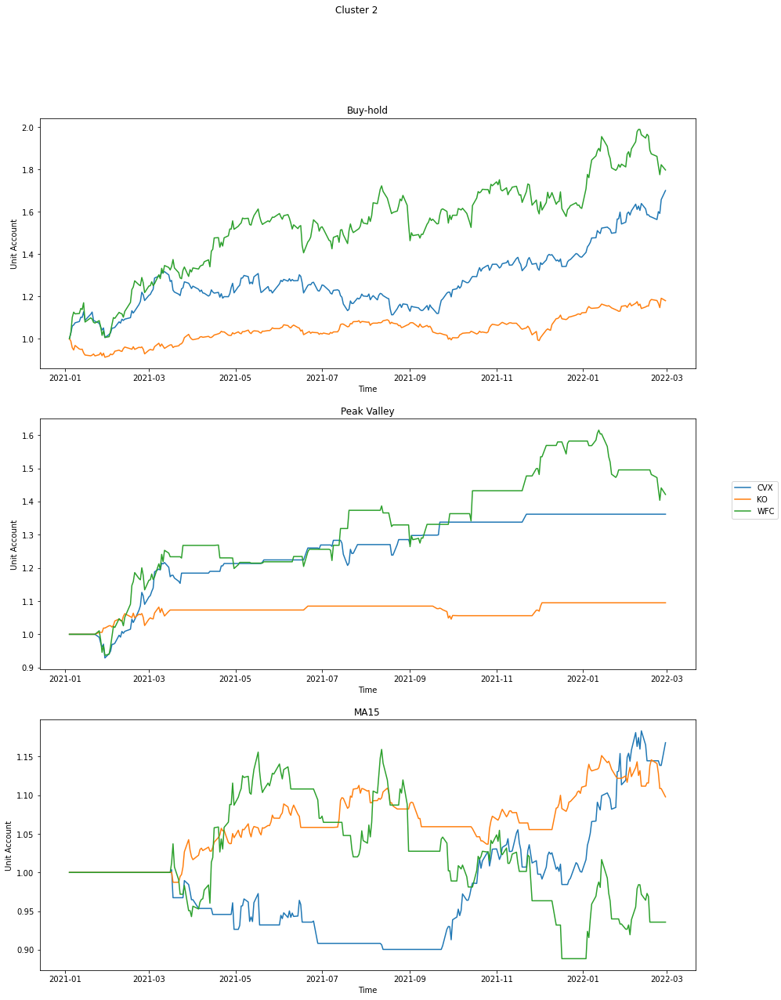

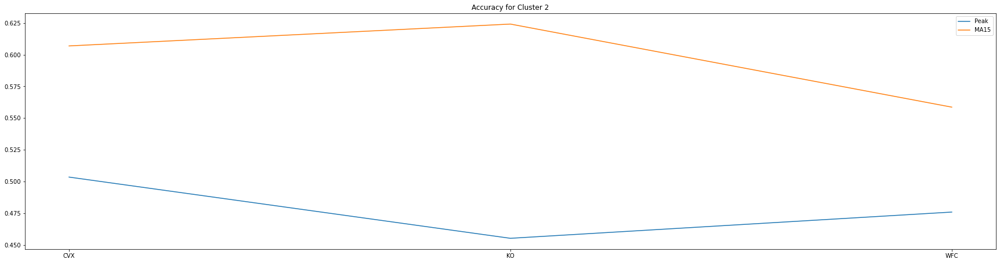

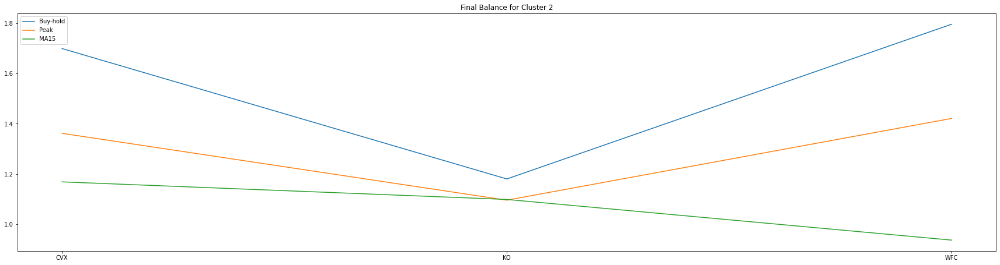

Cluster  3


C:\Users\Viri4\AppData\Local\Temp/ipykernel_9108/1111688533.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  12
Higher Peak Final Balance Count:  10
Higher MA15 Final Balance Count:  2
Avg Accuracy: [Peak, MA15] =  [0.51063218 0.68591954]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.18224253 1.00554879 1.16322689]


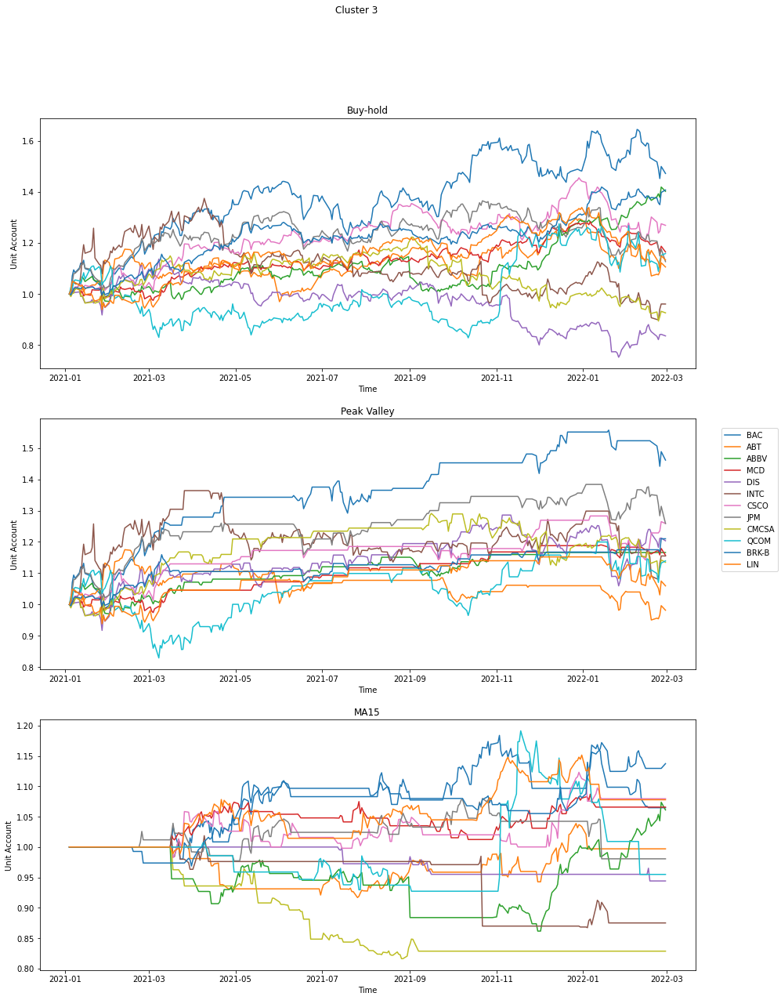

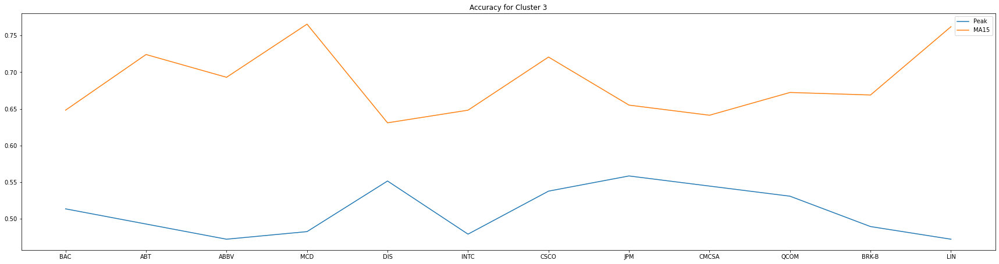

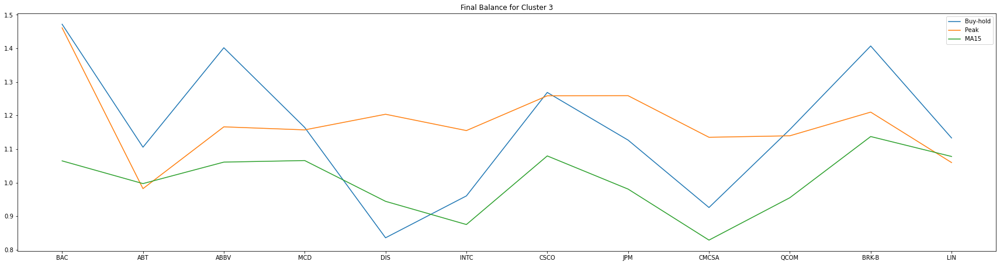

Cluster  4


C:\Users\Viri4\AppData\Local\Temp/ipykernel_9108/1111688533.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  3
Higher Peak Final Balance Count:  2
Higher MA15 Final Balance Count:  1
Avg Accuracy: [Peak, MA15] =  [0.51494253 0.65977011]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.15626126 1.01956352 1.20210187]


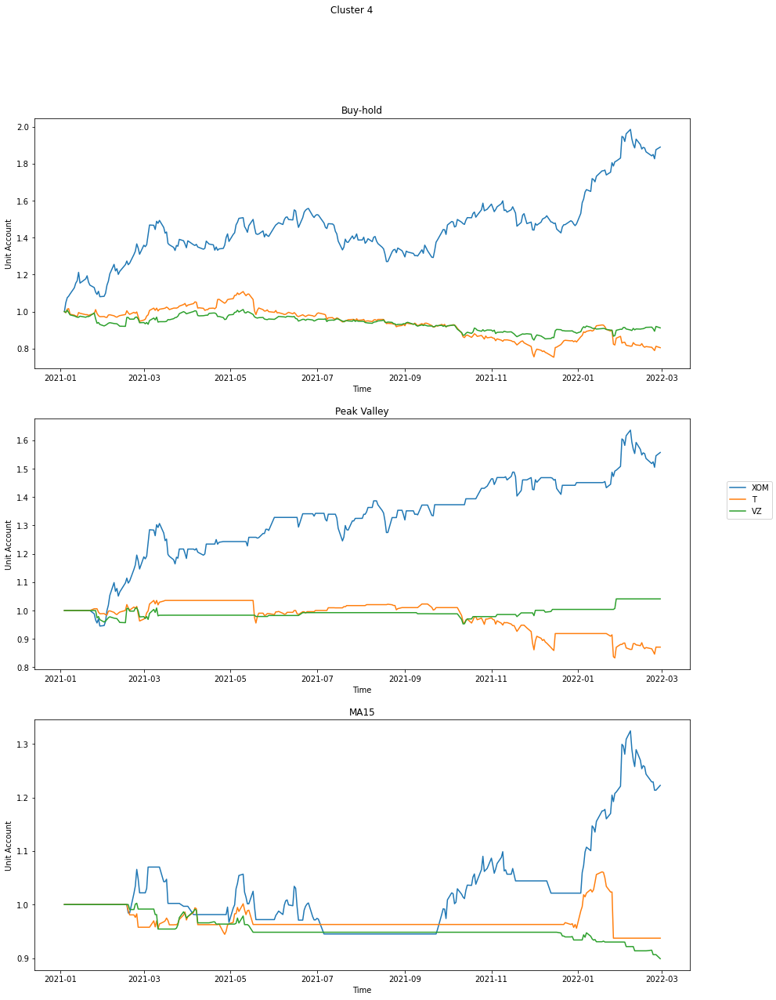

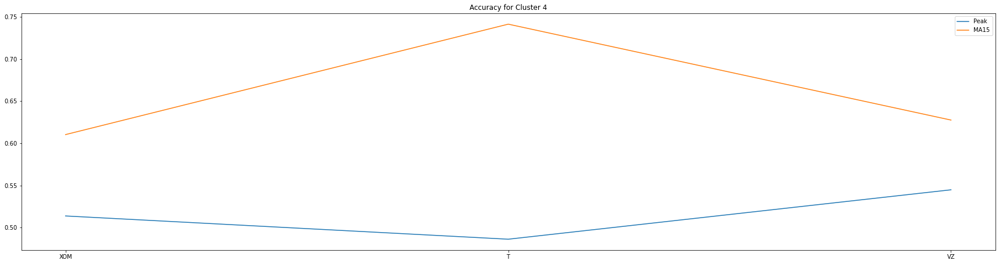

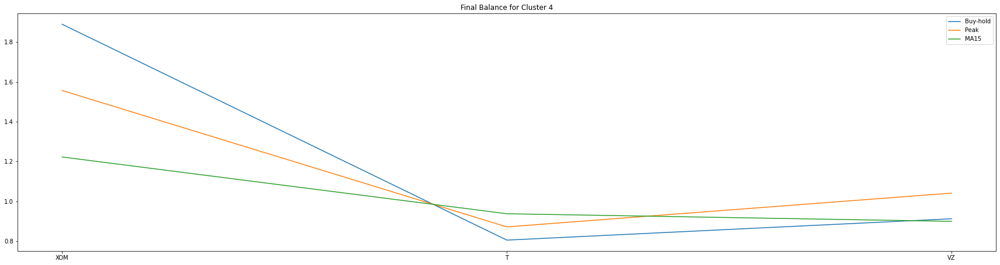

Cluster  5


C:\Users\Viri4\AppData\Local\Temp/ipykernel_9108/1111688533.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  6
Higher Peak Final Balance Count:  4
Higher MA15 Final Balance Count:  2
Avg Accuracy: [Peak, MA15] =  [0.48333333 0.7362069 ]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [0.98865121 1.05772243 1.08442302]


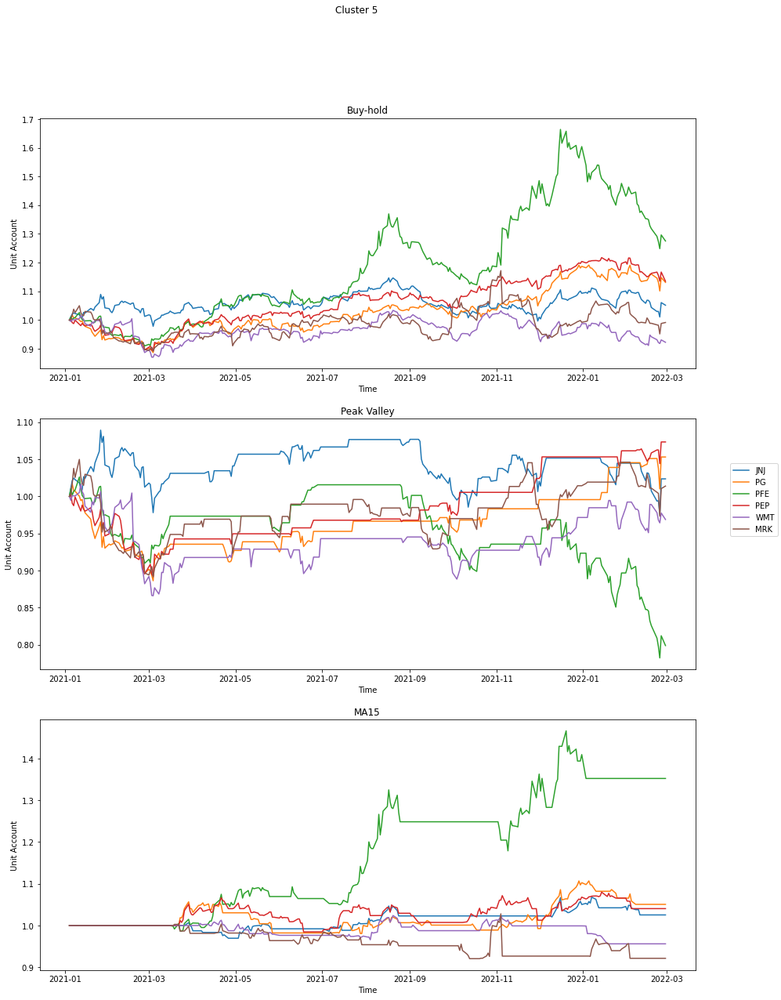

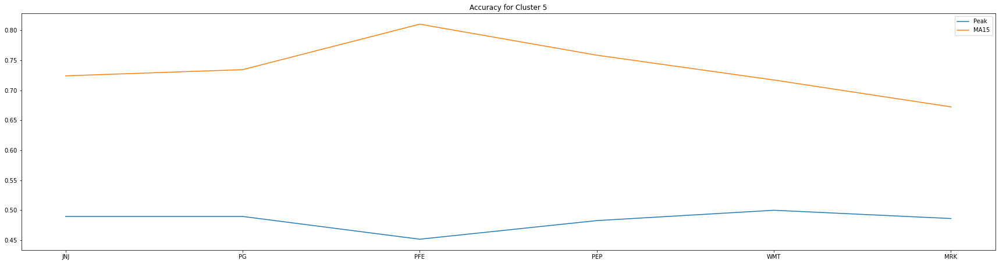

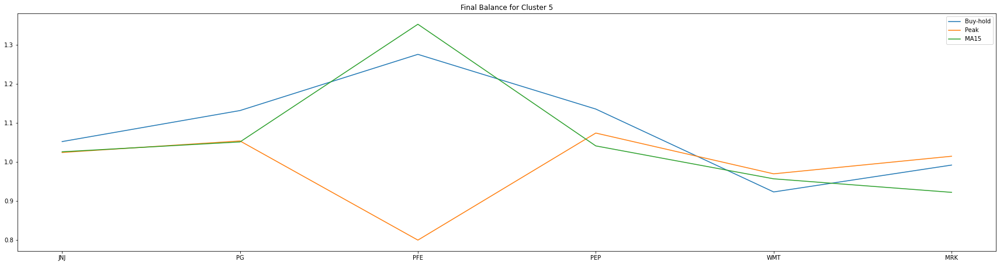

Cluster  6


C:\Users\Viri4\AppData\Local\Temp/ipykernel_9108/1111688533.py:70: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  6
Higher Peak Final Balance Count:  2
Higher MA15 Final Balance Count:  4
Avg Accuracy: [Peak, MA15] =  [0.50229885 0.71551724]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.08826255 1.13502758 1.13855429]


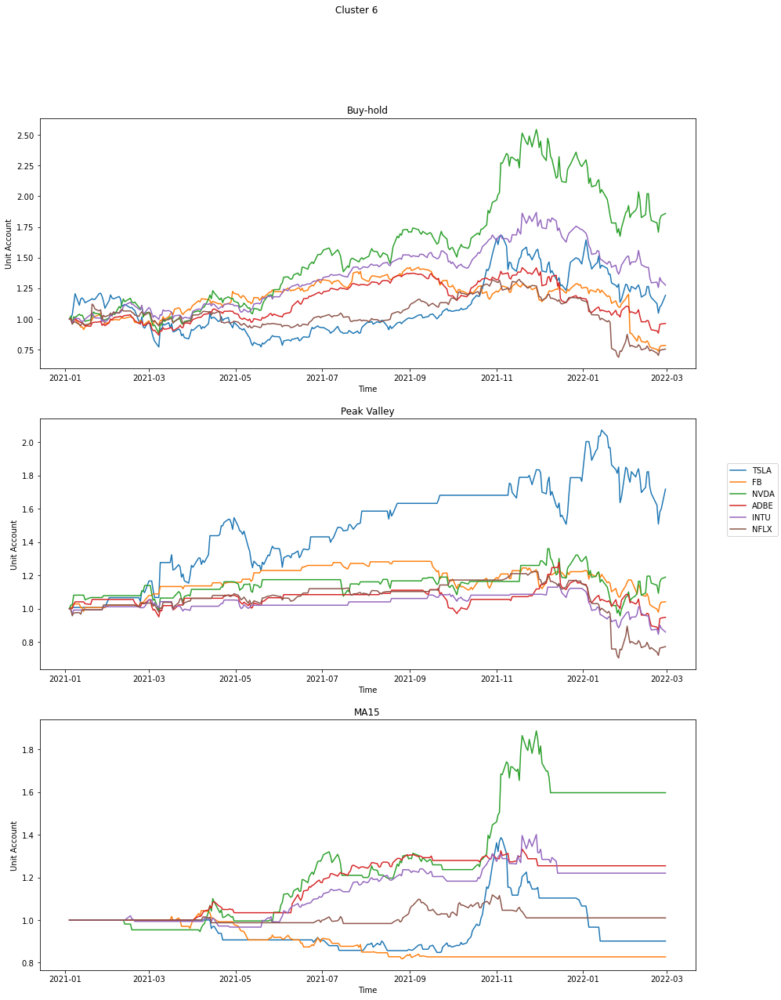

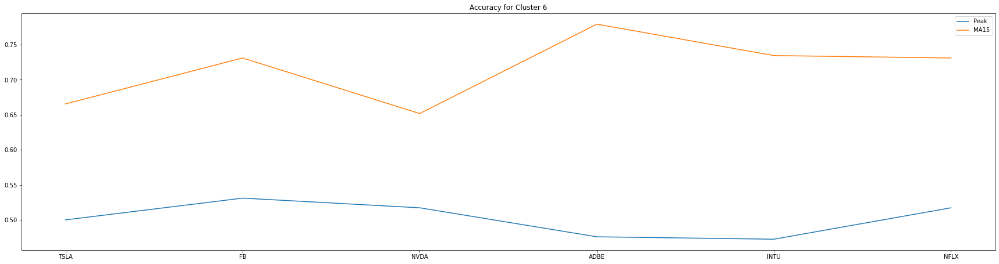

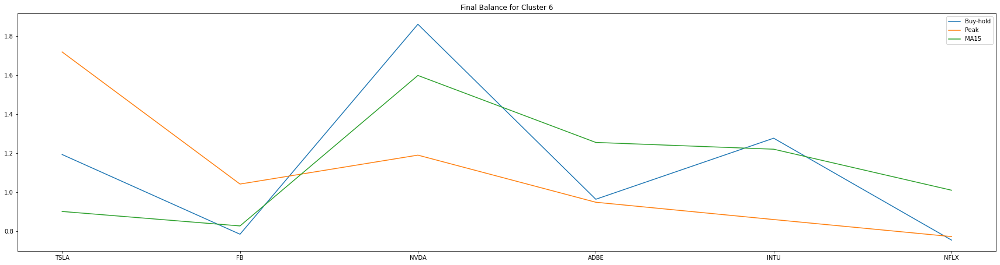

In [6]:
for i in range(len(clusters)):
    print("Cluster ", i+1)
    symbols = clusters[i]
    accuracy = np.zeros((len(symbols), 2))
    final_bal = np.zeros((len(symbols), 3))
    acc_peak_cnt = 0
    acc_MA15_cnt = 0
    acct_peak_cnt = 0
    acct_MA15_cnt = 0
    ind = 0
    fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
    fig.suptitle("Cluster {}".format(i+1))
    axB.set_title("Buy-hold")
    axB.set_xlabel("Time")
    axB.set_ylabel("Unit Account")
    axP.set_title("Peak Valley")
    axP.set_xlabel("Time")
    axP.set_ylabel("Unit Account")
    axM.set_title("MA15")
    axM.set_xlabel("Time")
    axM.set_ylabel("Unit Account")

    gnb_peak = GaussianNB()
    model_peak = gnb_peak.fit(cluster_train_data[i], cluster_train_labels_peak[i])
    gnb_MA15 = GaussianNB()
    model_MA15 = gnb_MA15.fit(cluster_train_data[i], cluster_train_labels_MA15[i])

    for symbol in symbols:
        # Get stock test data features and labels
        test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
        test_data = get_features_data(test_vals)
        test_labels_peak, _ = daily_peak_valley_labels(test_vals)
        test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
        test_data[np.isnan(test_data)] = 0

        # Buy-hold
        buy_hold = np.ones((len(test_labels_peak),))
        buy_hold_acct = simulate(test_vals, buy_hold)
        axB.plot(test_dates, buy_hold_acct, label=symbol)

        # Train with Gaussian NB
        preds_peak = gnb_peak.predict(test_data)
        acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
        # print(symbol, "Peak Valley Accuracy:", acc_peak)
        acct_peak = simulate(test_vals, preds_peak)
        # print(symbol, "Peak Valley Final Balance: ", acct_peak[-1])

        preds_MA15 = gnb_MA15.predict(test_data)
        acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
        # print(symbol, "MA15 Accuracy:", acc_MA15)
        acct_MA15 = simulate(test_vals, preds_MA15)
        # print(symbol, "MA15 Final Balance: ", acct_MA15[-1])

        # Plot Account
        axP.plot(test_dates, acct_peak, label=symbol)
        axM.plot(test_dates, acct_MA15, label=symbol)

        # Update variables
        accuracy[ind,0] = acc_peak
        accuracy[ind,1] = acc_MA15
        final_bal[ind, 0] = acct_peak[-1]
        final_bal[ind, 1] = acct_MA15[-1]
        final_bal[ind, 2] = buy_hold_acct[-1]
        ind += 1
        acc_peak_cnt += acc_peak > acc_MA15
        acc_MA15_cnt += acc_MA15 > acc_peak
        acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
        acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]

    fig.legend([axB, axP, axM], labels=symbols, loc="center right")
    print("Higher Peak Accuracy Count: ", acc_peak_cnt)
    print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
    print("Higher Peak Final Balance Count: ", acct_peak_cnt)
    print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
    print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
    print("Avg Final Balance: [Peak, MA15, Buy-hold] = ", np.mean(final_bal, axis=0))
    plt.figure(figsize=(30,7.5))
    plt.plot(symbols, accuracy[:,0], label='Peak')
    plt.plot(symbols, accuracy[:,1], label='MA15')
    plt.legend()
    plt.title("Accuracy for Cluster {}".format(i+1))
    plt.show()
    plt.figure(figsize=(30,7.5))
    plt.plot(symbols, final_bal[:,2], label='Buy-hold')
    plt.plot(symbols, final_bal[:,0], label='Peak')
    plt.plot(symbols, final_bal[:,1], label='MA15')
    plt.legend()
    plt.title("Final Balance for Cluster {}".format(i+1))
    plt.show()

Cluster  1
Peak Comp: 10 , Final Balance: 1.250214205471696
MA15 Comp: 19 , Final Balance: 1.1560924165330981


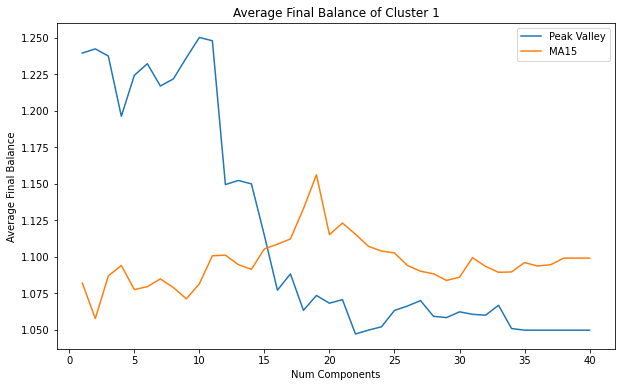

Cluster  2
Peak Comp: 21 , Final Balance: 1.4548323141862145
MA15 Comp: 14 , Final Balance: 1.439859096689517


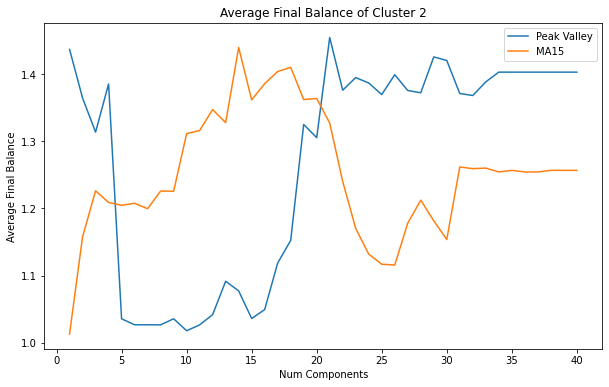

Cluster  3
Peak Comp: 11 , Final Balance: 1.198206072747209
MA15 Comp: 20 , Final Balance: 1.1304122538759225


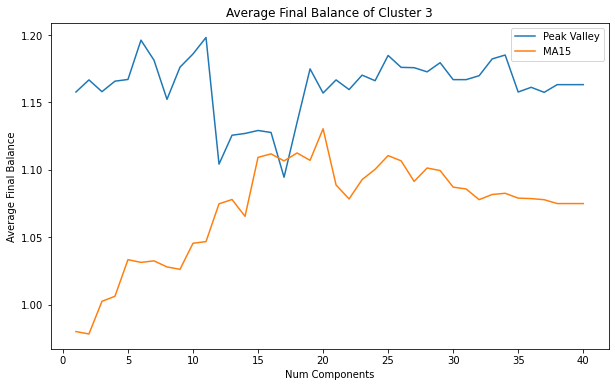

Cluster  4
Peak Comp: 2 , Final Balance: 1.3017534454122095
MA15 Comp: 19 , Final Balance: 1.1580910227870997


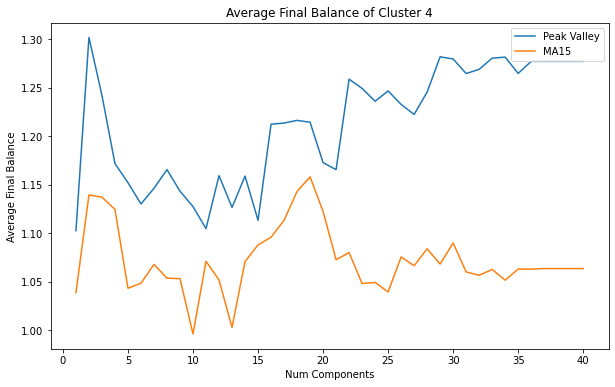

Cluster  5
Peak Comp: 3 , Final Balance: 1.1579302517312293
MA15 Comp: 10 , Final Balance: 1.150108564110668


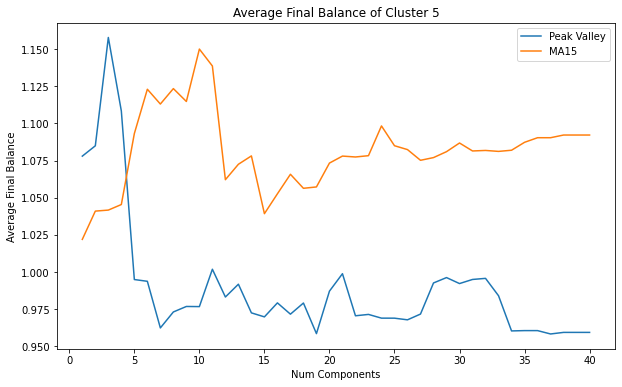

Cluster  6
Peak Comp: 18 , Final Balance: 1.287122207304606
MA15 Comp: 18 , Final Balance: 1.399850672178632


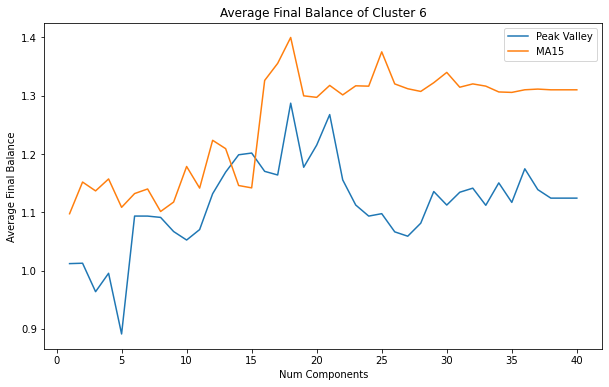

In [7]:
comp_list = list(range(1, 41))
for c in range(len(clusters)):
  print("Cluster ", c+1)
  stocks = clusters[c]
  peak_avg_accs = []
  peak_avg_final_bal = []
  MA15_avg_accs = []
  MA15_avg_final_bal = []
  for i in comp_list:
    accuracy = np.zeros((len(stocks), 2))
    final_bal = np.zeros((len(stocks), 2))
    ind = 0

    pca = PCA(n_components=i)
    train_data_pca = pca.fit_transform(cluster_train_data[c])    
    gnb_peak = GaussianNB()
    model_peak = gnb_peak.fit(train_data_pca, cluster_train_labels_peak[c])
    gnb_MA15 = GaussianNB()
    model_MA15 = gnb_MA15.fit(train_data_pca, cluster_train_labels_MA15[c])

    for symbol in stocks:
      # Get stock test data features and labels
      test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
      test_data = get_features_data(test_vals)
      test_labels_peak, _ = daily_peak_valley_labels(test_vals)
      test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
      test_data[np.isnan(test_data)] = 0

      # Apply PCA to data
      test_data_pca = pca.transform(test_data)

      # Train with Gaussian NB
      preds_peak = gnb_peak.predict(test_data_pca)
      acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
      acct_peak = simulate(test_vals, preds_peak)

      preds_MA15 = gnb_MA15.predict(test_data_pca)
      acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
      acct_MA15 = simulate(test_vals, preds_MA15)

      # Update variables
      accuracy[ind,0] = acc_peak
      accuracy[ind,1] = acc_MA15
      final_bal[ind, 0] = acct_peak[-1]
      final_bal[ind, 1] = acct_MA15[-1]
      ind += 1

    avg_accuracy = np.mean(accuracy, axis=0)
    avg_final_bal = np.mean(final_bal, axis=0)
    peak_avg_accs.append(avg_accuracy[0])
    peak_avg_final_bal.append(avg_final_bal[0])
    MA15_avg_accs.append(avg_accuracy[1])
    MA15_avg_final_bal.append(avg_final_bal[1])

  print("Peak Comp:", np.argmax(peak_avg_final_bal)+1, ", Final Balance:", np.max(peak_avg_final_bal))
  print("MA15 Comp:", np.argmax(MA15_avg_final_bal)+1, ", Final Balance:", np.max(MA15_avg_final_bal))

  # fig, (ax_acc, ax_final_bal) = plt.subplots(2,1, figsize=(10,12))
  # ax_acc.plot(comp_list, peak_avg_accs, label="Peak Valley")
  # ax_acc.plot(comp_list, MA15_avg_accs, label="MA15")
  # ax_acc.set_title("Average Accuracy of Cluster {}".format(c+1))
  # ax_acc.set_xlabel("Num Components")
  # ax_acc.set_ylabel("Average Accuracy")

  plt.figure(figsize=(10,6))
  plt.plot(comp_list, peak_avg_final_bal, label="Peak Valley")
  plt.plot(comp_list, MA15_avg_final_bal, label="MA15")
  plt.title("Average Final Balance of Cluster {}".format(c+1))
  plt.xlabel("Num Components")
  plt.ylabel("Average Final Balance")
  plt.legend()

  # ax_final_bal.plot(comp_list, peak_avg_final_bal, label="Peak Valley")
  # ax_final_bal.plot(comp_list, MA15_avg_final_bal, label="MA15")
  # ax_final_bal.set_title("Average Final Balance of Cluster {}".format(c+1))
  # ax_final_bal.set_xlabel("Num Components")
  # ax_final_bal.set_ylabel("Average Final Balance")
  # fig.legend([ax_acc, ax_final_bal], labels=["Peak Valley", "MA15"], loc="center right")
  plt.show()

Optimal PCA

Cluster  1


C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/1768155946.py:73: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  19
Higher Peak Final Balance Count:  16
Higher MA15 Final Balance Count:  3
Avg Accuracy: [Peak, MA15] =  [0.52976407 0.66914701]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.25021421 1.08142691 1.23951547]


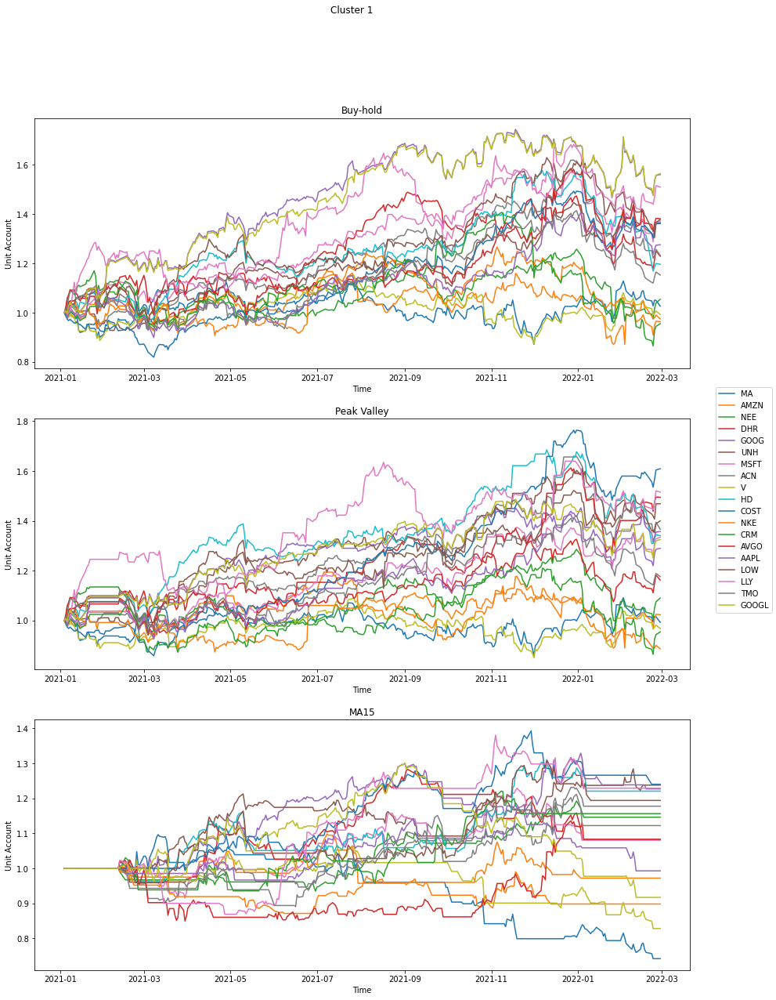

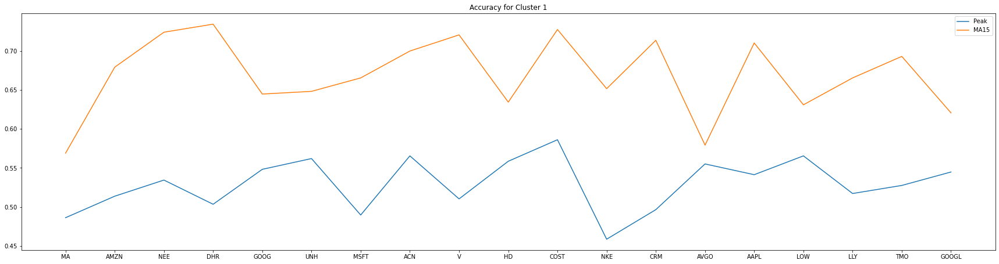

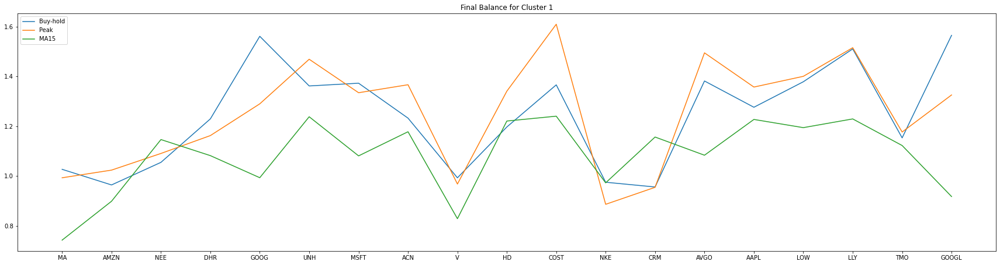

Cluster  2


C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/1768155946.py:73: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  2
Higher MA15 Accuracy Count:  1
Higher Peak Final Balance Count:  2
Higher MA15 Final Balance Count:  1
Avg Accuracy: [Peak, MA15] =  [0.50229885 0.53448276]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.45483231 1.32736437 1.55885621]


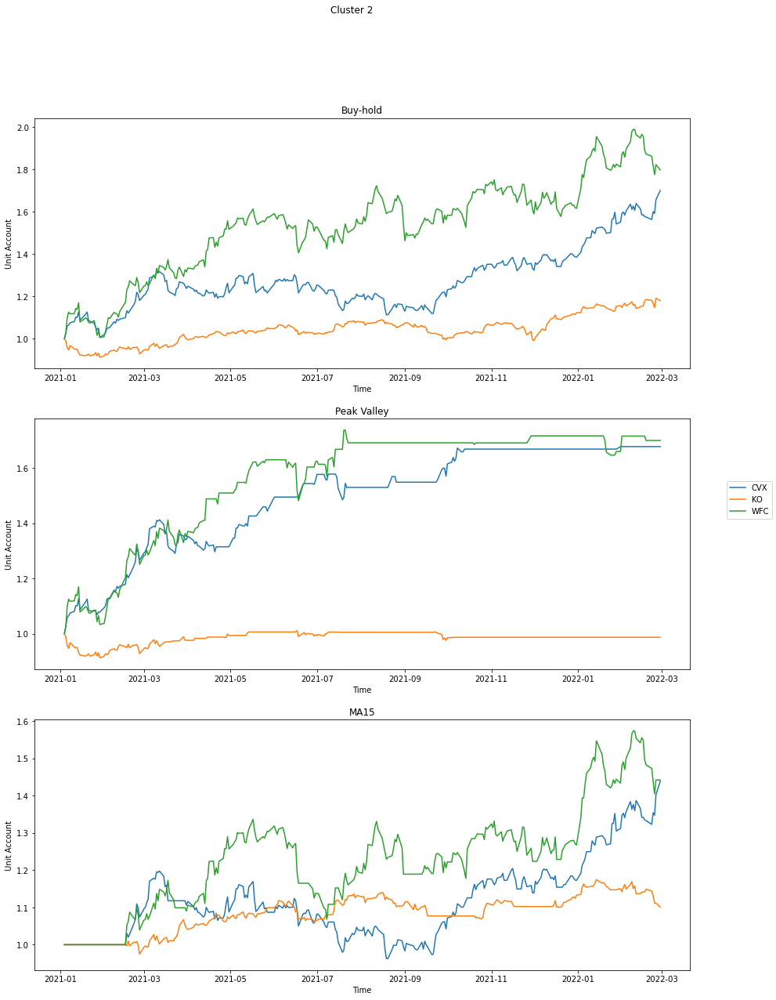

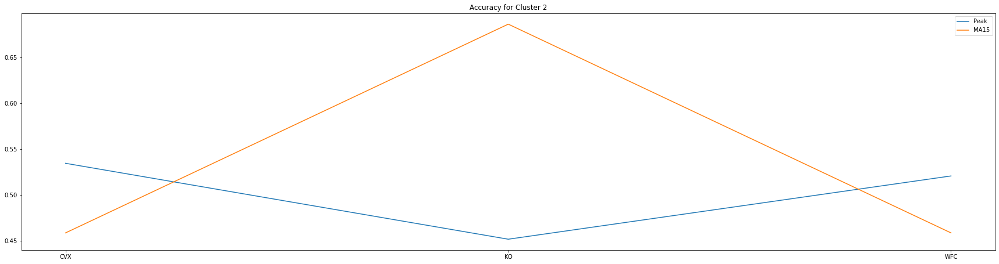

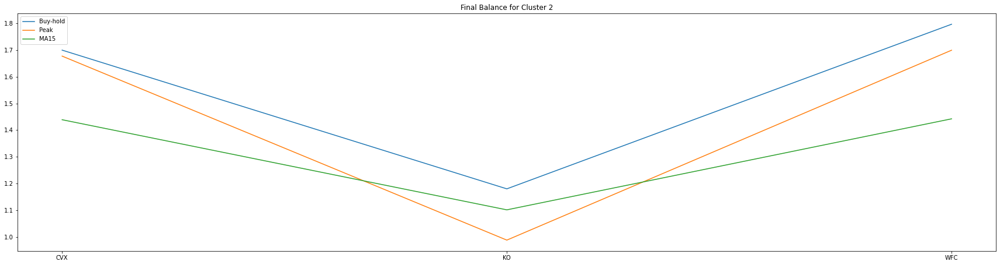

Cluster  3


C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/1768155946.py:73: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  12
Higher Peak Final Balance Count:  11
Higher MA15 Final Balance Count:  1
Avg Accuracy: [Peak, MA15] =  [0.51695402 0.60488506]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.19820607 1.04668446 1.16322689]


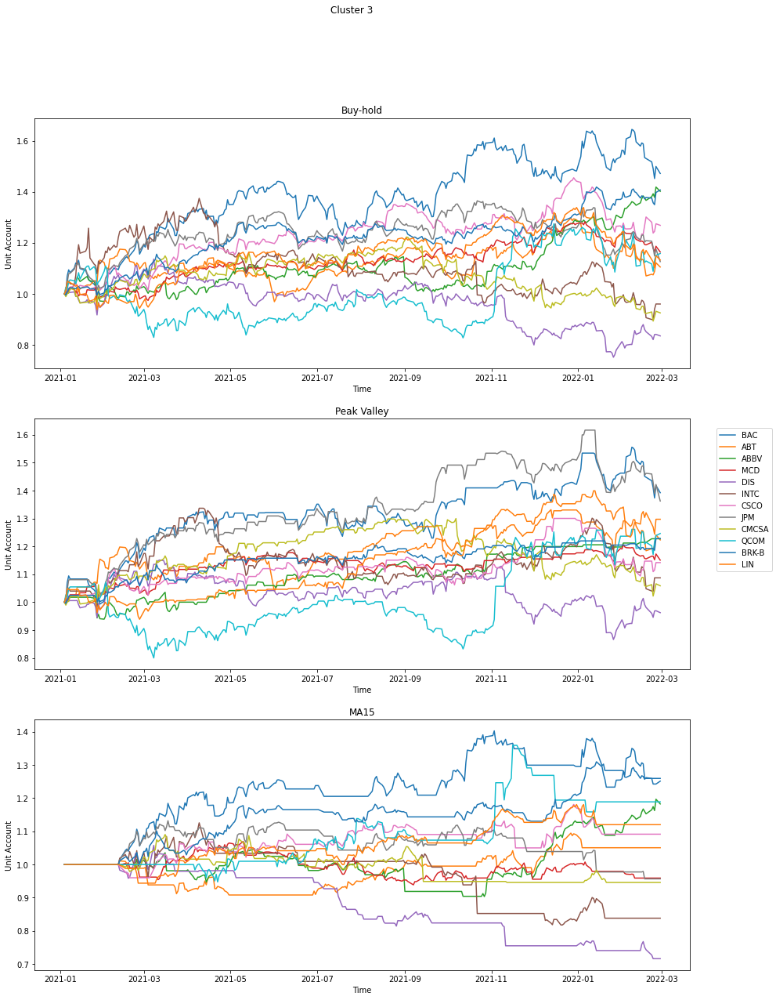

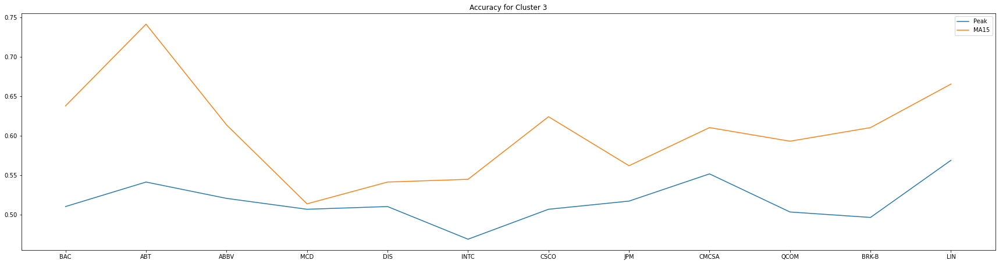

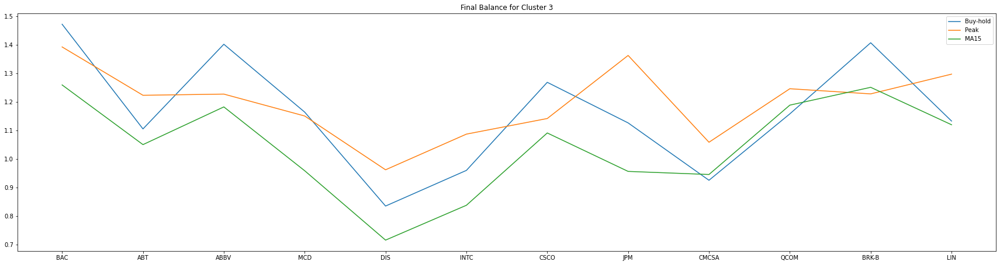

Cluster  4


C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/1768155946.py:73: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  3
Higher Peak Final Balance Count:  2
Higher MA15 Final Balance Count:  1
Avg Accuracy: [Peak, MA15] =  [0.52068966 0.69655172]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.30175345 1.1393762  1.20210187]


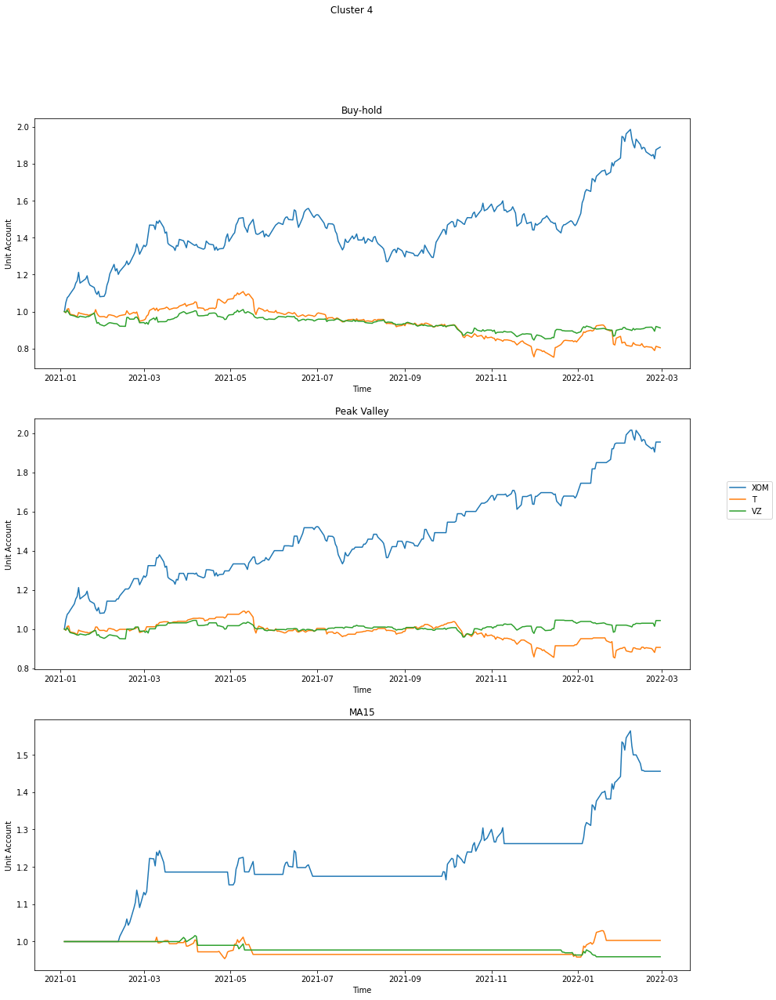

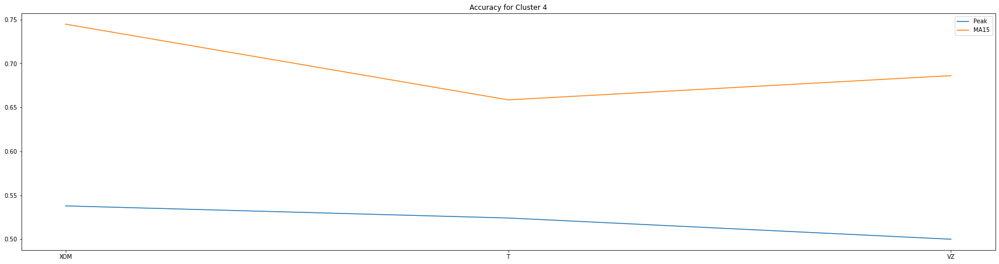

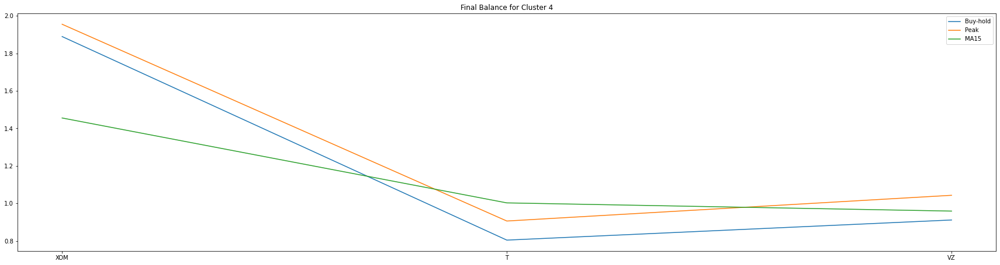

Cluster  5


C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/1768155946.py:73: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  6
Higher Peak Final Balance Count:  5
Higher MA15 Final Balance Count:  1
Avg Accuracy: [Peak, MA15] =  [0.51494253 0.72241379]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.15793025 1.04169596 1.08442302]


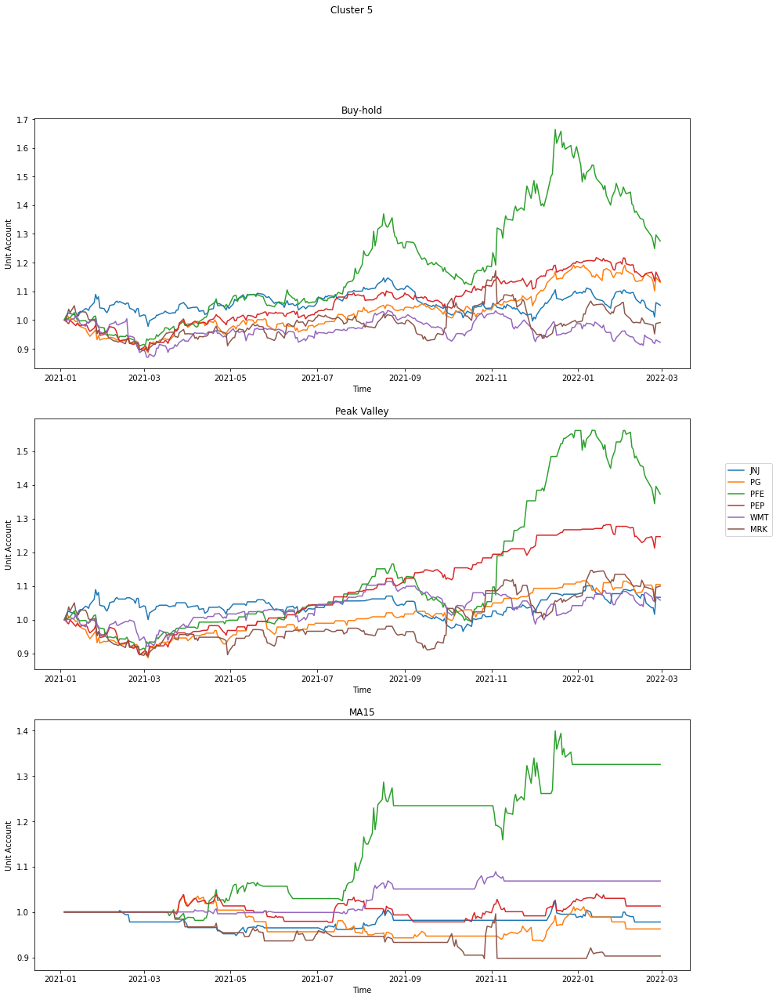

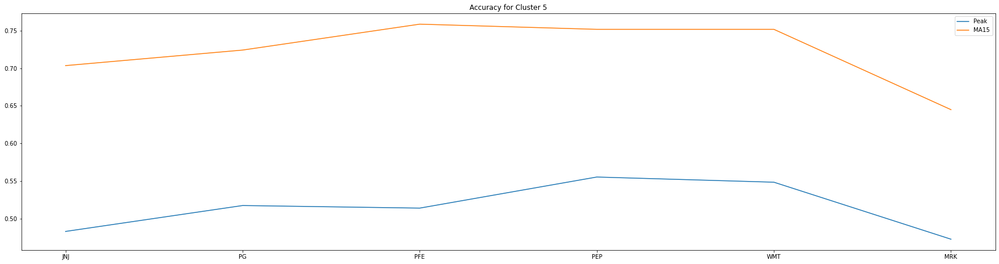

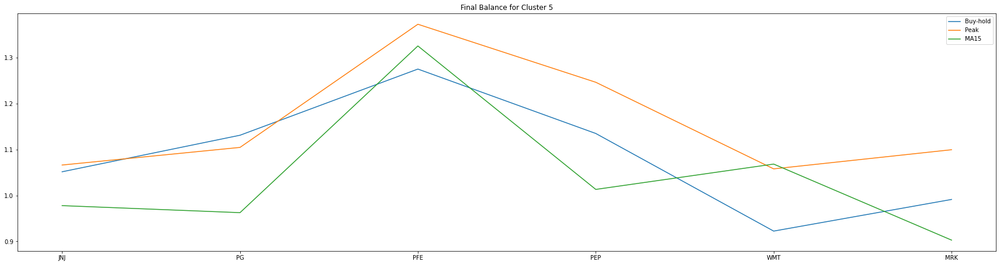

Cluster  6


C:\Users\Viri4\AppData\Local\Temp/ipykernel_16680/1768155946.py:73: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend([axB, axP, axM], labels=symbols, loc="center right")


Higher Peak Accuracy Count:  0
Higher MA15 Accuracy Count:  6
Higher Peak Final Balance Count:  4
Higher MA15 Final Balance Count:  2
Avg Accuracy: [Peak, MA15] =  [0.53045977 0.65114943]
Avg Final Balance: [Peak, MA15, Buy-hold] =  [1.28712221 1.39985067 1.13855429]


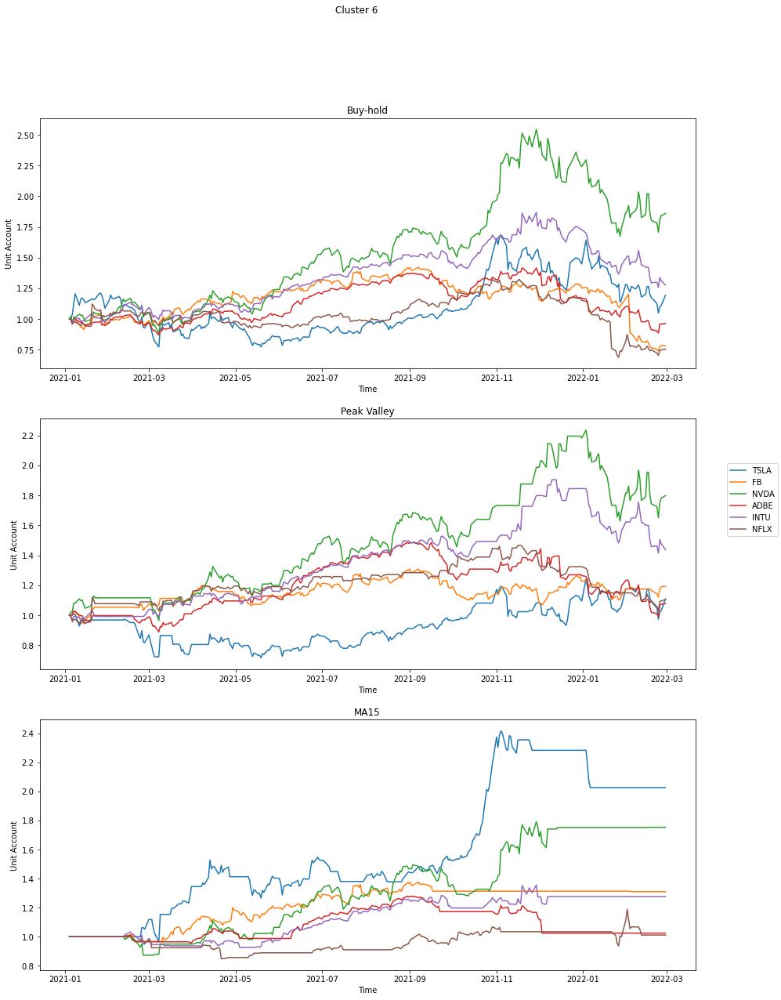

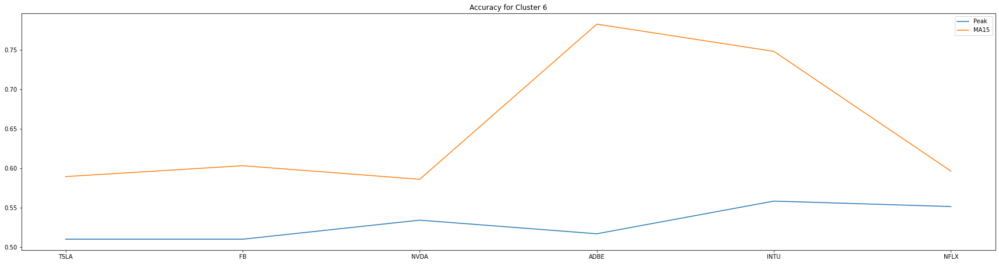

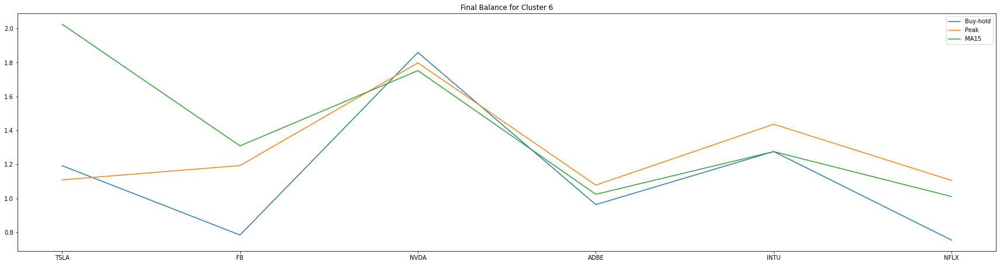

In [7]:
pca_comp_list = [10, 21, 11, 2, 3, 18]
for i in range(len(clusters)):
    print("Cluster ", i+1)
    symbols = clusters[i]
    accuracy = np.zeros((len(symbols), 2))
    final_bal = np.zeros((len(symbols), 3))
    acc_peak_cnt = 0
    acc_MA15_cnt = 0
    acct_peak_cnt = 0
    acct_MA15_cnt = 0
    ind = 0
    fig, (axB, axP, axM) = plt.subplots(3,1, figsize=(15,20))
    fig.suptitle("Cluster {}".format(i+1))
    axB.set_title("Buy-hold")
    axB.set_xlabel("Time")
    axB.set_ylabel("Unit Account")
    axP.set_title("Peak Valley")
    axP.set_xlabel("Time")
    axP.set_ylabel("Unit Account")
    axM.set_title("MA15")
    axM.set_xlabel("Time")
    axM.set_ylabel("Unit Account")

    pca = PCA(n_components=pca_comp_list[i])
    train_data_pca = pca.fit_transform(cluster_train_data[i])    
    gnb_peak = GaussianNB()
    model_peak = gnb_peak.fit(train_data_pca, cluster_train_labels_peak[i])
    gnb_MA15 = GaussianNB()
    model_MA15 = gnb_MA15.fit(train_data_pca, cluster_train_labels_MA15[i])

    for symbol in symbols:
        # Get stock test data features and labels
        test_dates, test_vals = pull_data_from_csv(symbol, "test_data")
        test_data = get_features_data(test_vals)
        test_labels_peak, _ = daily_peak_valley_labels(test_vals)
        test_labels_MA15, _ = MA15_trend_analysis_labels(test_vals)
        test_data[np.isnan(test_data)] = 0

        # Buy-hold
        buy_hold = np.ones((len(test_labels_peak),))
        buy_hold_acct = simulate(test_vals, buy_hold)
        axB.plot(test_dates, buy_hold_acct, label=symbol)

        # Apply PCA to data
        test_data_pca = pca.transform(test_data)

        # Train with Gaussian NB
        preds_peak = gnb_peak.predict(test_data_pca)
        acc_peak = metrics.accuracy_score(test_labels_peak, preds_peak)
        acct_peak = simulate(test_vals, preds_peak)

        preds_MA15 = gnb_MA15.predict(test_data_pca)
        acc_MA15 = metrics.accuracy_score(test_labels_MA15, preds_MA15)
        acct_MA15 = simulate(test_vals, preds_MA15)

        # Plot Account
        axP.plot(test_dates, acct_peak, label=symbol)
        axM.plot(test_dates, acct_MA15, label=symbol)

        # Update variables
        accuracy[ind,0] = acc_peak
        accuracy[ind,1] = acc_MA15
        final_bal[ind, 0] = acct_peak[-1]
        final_bal[ind, 1] = acct_MA15[-1]
        final_bal[ind, 2] = buy_hold_acct[-1]
        max_final_bal[symbol] =  final_bal[ind, 0:2] - max_final_bal[symbol]
        ind += 1
        acc_peak_cnt += acc_peak > acc_MA15
        acc_MA15_cnt += acc_MA15 > acc_peak
        acct_peak_cnt += acct_peak[-1] > acct_MA15[-1]
        acct_MA15_cnt += acct_MA15[-1] > acct_peak[-1]

    fig.legend([axB, axP, axM], labels=symbols, loc="center right")
    print("Higher Peak Accuracy Count: ", acc_peak_cnt)
    print("Higher MA15 Accuracy Count: ", acc_MA15_cnt)
    print("Higher Peak Final Balance Count: ", acct_peak_cnt)
    print("Higher MA15 Final Balance Count: ", acct_MA15_cnt)
    print("Avg Accuracy: [Peak, MA15] = ", np.mean(accuracy, axis=0))
    print("Avg Final Balance: [Peak, MA15, Buy-hold] = ", np.mean(final_bal, axis=0))
    plt.figure(figsize=(30,7.5))
    plt.plot(symbols, accuracy[:,0], label='Peak')
    plt.plot(symbols, accuracy[:,1], label='MA15')
    plt.legend()
    plt.title("Accuracy for Cluster {}".format(i+1))
    plt.show()
    plt.figure(figsize=(30,7.5))
    plt.plot(symbols, final_bal[:,2], label='Buy-hold')
    plt.plot(symbols, final_bal[:,0], label='Peak')
    plt.plot(symbols, final_bal[:,1], label='MA15')
    plt.legend()
    plt.title("Final Balance for Cluster {}".format(i+1))
    plt.show()

Peak-Valley
Positive: 31
Same: 0
Negative: 19
Total Change: 2.092228246517421
Average Change: 0.041844564930348424


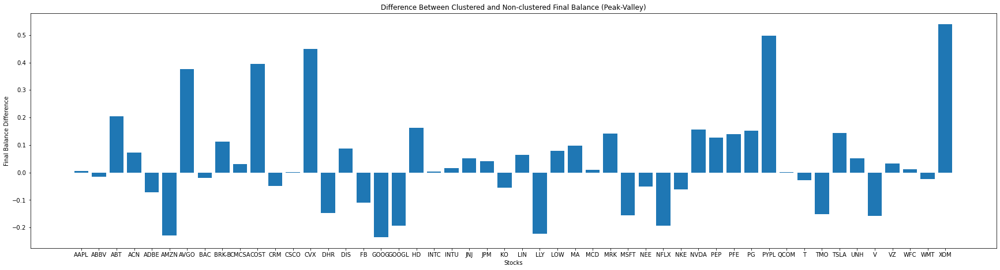

MA15
Positive: 20
Same: 0
Negative: 30
Total Change: -0.920252416076959
Average Change: -0.018405048321539177


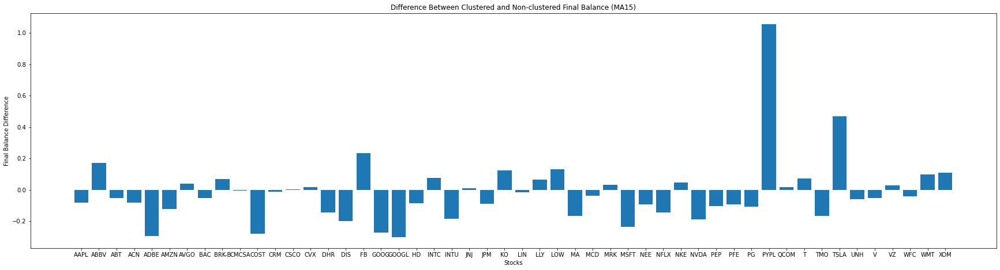

In [8]:
symbols = []
final_bal_diff_peak = []
final_bal_diff_MA15 = []
for stock in max_final_bal.keys():
    symbols.append(stock)
    final_bals = max_final_bal[stock]
    final_bal_diff_peak.append(final_bals[0])
    final_bal_diff_MA15.append(final_bals[1])
print("Peak-Valley")
print("Positive:", np.sum(np.array(final_bal_diff_peak)>0))
print("Same:", np.sum(np.array(final_bal_diff_peak)==0))
print("Negative:", np.sum(np.array(final_bal_diff_peak)<0))
print("Total Change:", np.sum(final_bal_diff_peak))
print("Average Change:", np.mean(final_bal_diff_peak))
plt.figure(figsize=(30,7.5))
plt.bar(symbols, final_bal_diff_peak)
plt.xlabel('Stocks')
plt.ylabel('Final Balance Difference')
plt.title('Difference Between Clustered and Non-clustered Final Balance (Peak-Valley)')
plt.show()

print("MA15")
print("Positive:", np.sum(np.array(final_bal_diff_MA15)>0))
print("Same:", np.sum(np.array(final_bal_diff_MA15)==0))
print("Negative:", np.sum(np.array(final_bal_diff_MA15)<0))
print("Total Change:", np.sum(final_bal_diff_MA15))
print("Average Change:", np.mean(final_bal_diff_MA15))
plt.figure(figsize=(30,7.5))
plt.bar(symbols, final_bal_diff_MA15)
plt.xlabel('Stocks')
plt.ylabel('Final Balance Difference')
plt.title('Difference Between Clustered and Non-clustered Final Balance (MA15)')
plt.show()

Cluster  1
Peak-Valley
Positive: 8
Same: 0
Negative: 11
Total Change: -0.4078437470178611
Average Change: -0.02146546036936111


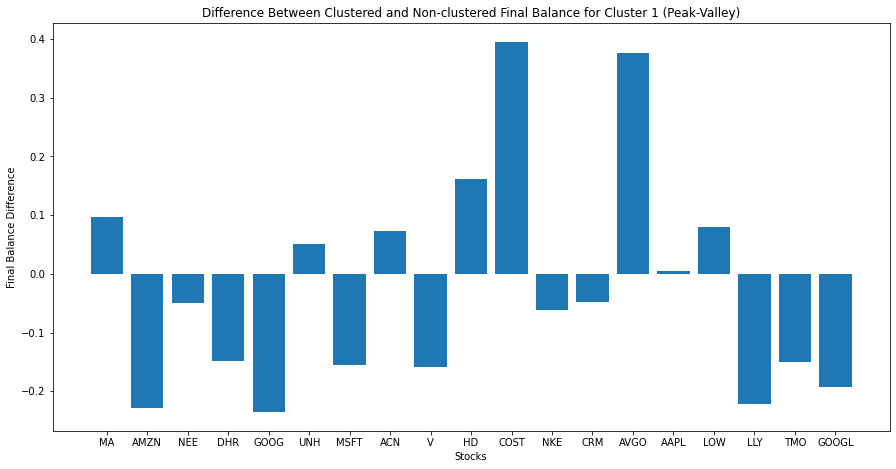

MA15
Positive: 4
Same: 0
Negative: 15
Total Change: -1.8783987577395975
Average Change: -0.0988630925126104


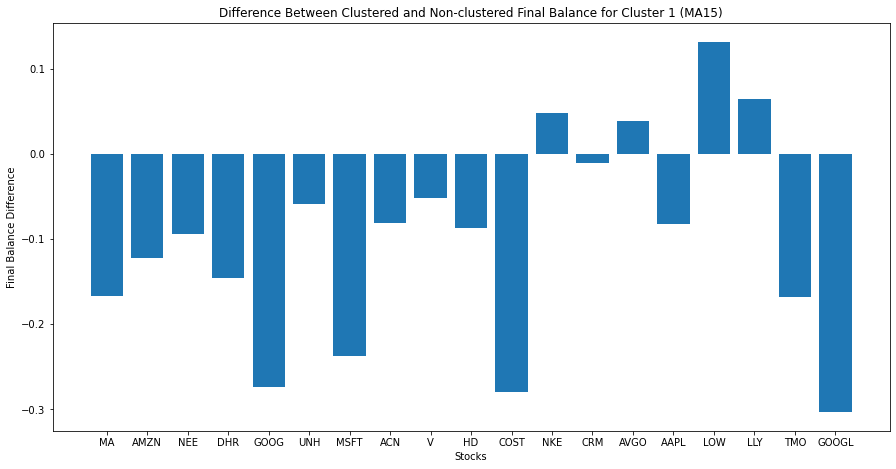

Cluster  2
Peak-Valley
Positive: 2
Same: 0
Negative: 1
Total Change: 0.40630007023697323
Average Change: 0.13543335674565773


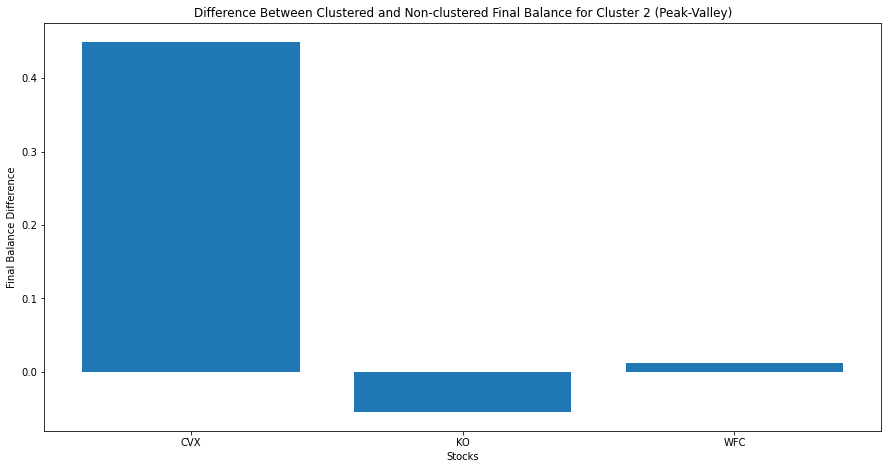

MA15
Positive: 2
Same: 0
Negative: 1
Total Change: 0.09617733683859742
Average Change: 0.032059112279532474


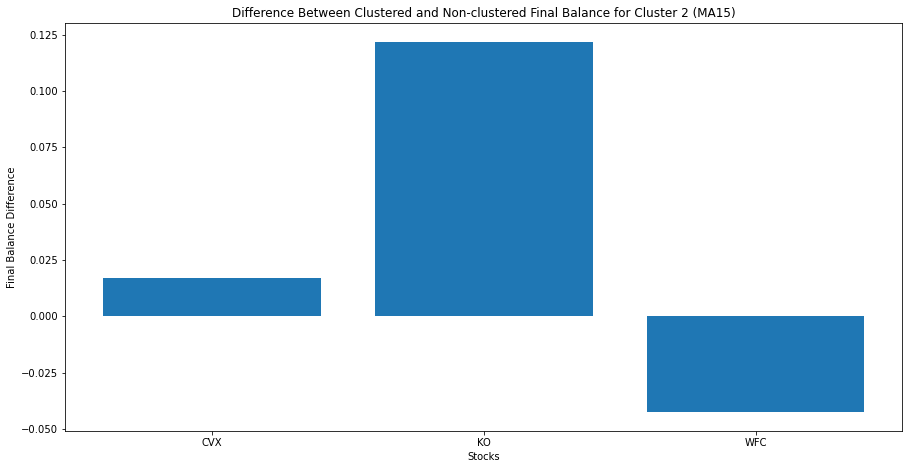

Cluster  3
Peak-Valley
Positive: 10
Same: 0
Negative: 2
Total Change: 0.521463337803972
Average Change: 0.043455278150331005


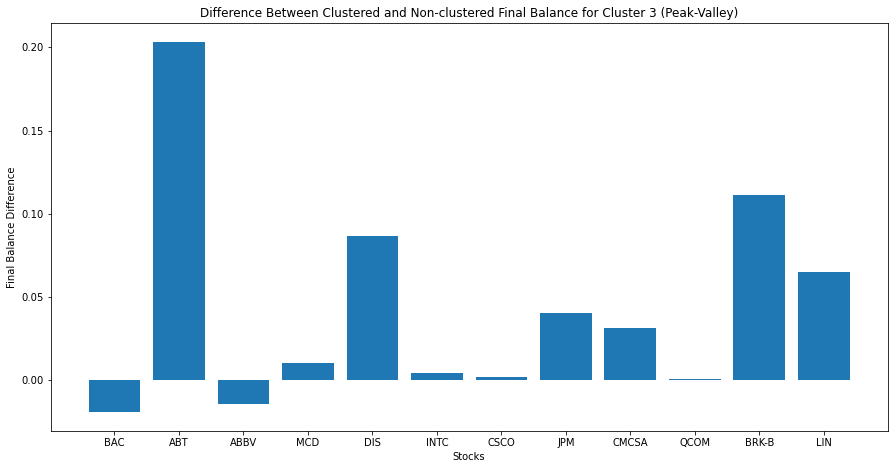

MA15
Positive: 5
Same: 0
Negative: 7
Total Change: -0.12169248489682594
Average Change: -0.010141040408068827


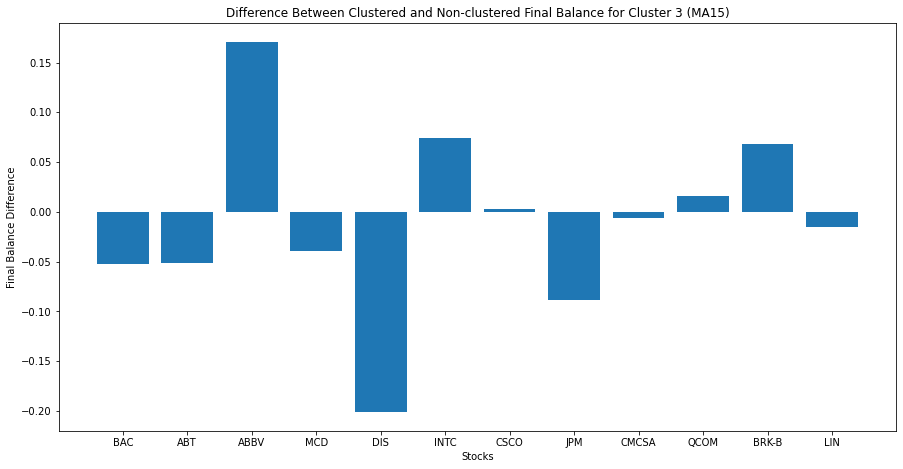

Cluster  4
Peak-Valley
Positive: 2
Same: 0
Negative: 1
Total Change: 0.5445218802809828
Average Change: 0.18150729342699426


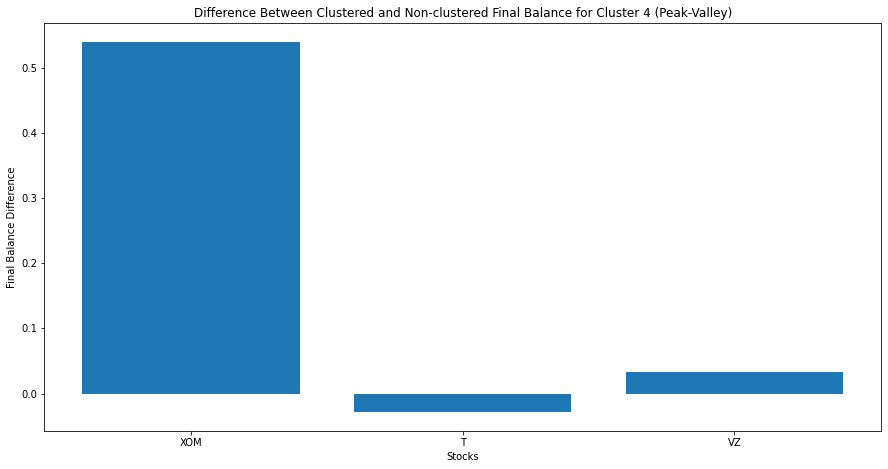

MA15
Positive: 3
Same: 0
Negative: 0
Total Change: 0.20891713380241905
Average Change: 0.06963904460080635


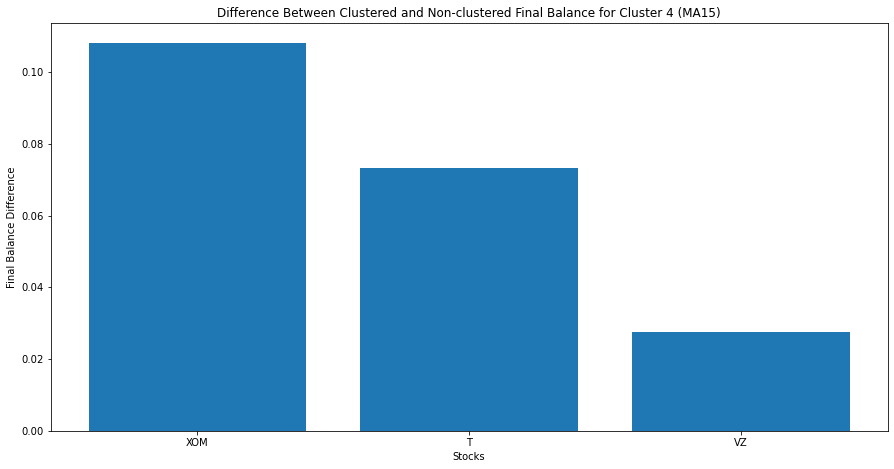

Cluster  5
Peak-Valley
Positive: 5
Same: 0
Negative: 1
Total Change: 0.5907178999510315
Average Change: 0.09845298332517192


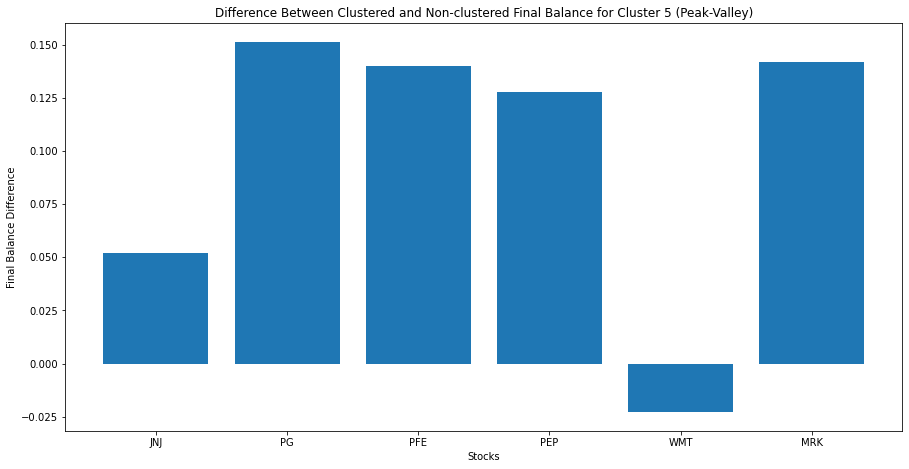

MA15
Positive: 3
Same: 0
Negative: 3
Total Change: -0.16883059347518903
Average Change: -0.028138432245864837


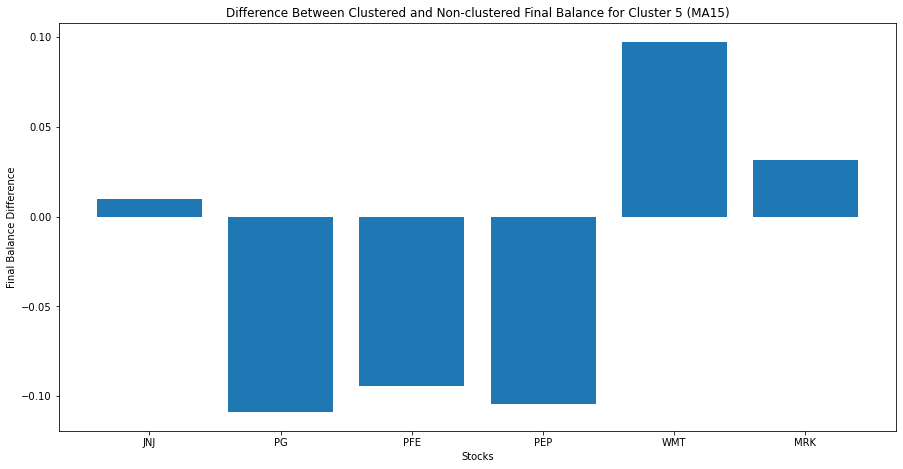

Cluster  6
Peak-Valley
Positive: 3
Same: 0
Negative: 3
Total Change: -0.060429058743247
Average Change: -0.010071509790541167


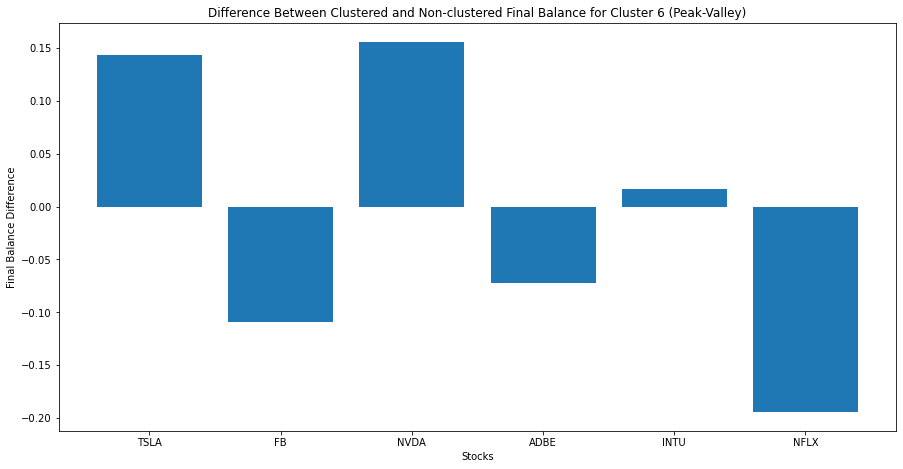

MA15
Positive: 2
Same: 0
Negative: 4
Total Change: -0.11326488440483407
Average Change: -0.018877480734139012


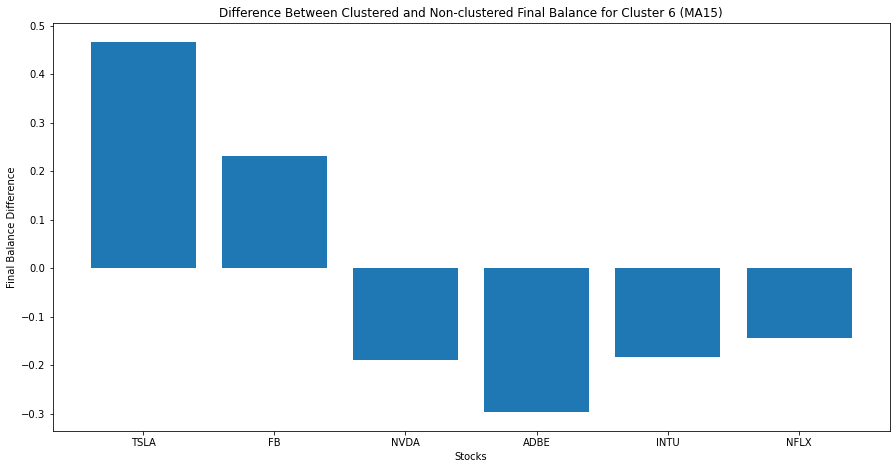

In [9]:
for c in range(len(clusters)):
    print("Cluster ", c+1)
    symbols = clusters[c]
    final_bal_diff_peak = []
    final_bal_diff_MA15 = []
    for stock in symbols:
        final_bals = max_final_bal[stock]
        final_bal_diff_peak.append(final_bals[0])
        final_bal_diff_MA15.append(final_bals[1])
   
    print("Peak-Valley")
    print("Positive:", np.sum(np.array(final_bal_diff_peak)>0))
    print("Same:", np.sum(np.array(final_bal_diff_peak)==0))
    print("Negative:", np.sum(np.array(final_bal_diff_peak)<0))
    print("Total Change:", np.sum(final_bal_diff_peak))
    print("Average Change:", np.mean(final_bal_diff_peak))
    plt.figure(figsize=(15,7.5))
    plt.bar(symbols, final_bal_diff_peak)
    plt.xlabel('Stocks')
    plt.ylabel('Final Balance Difference')
    plt.title('Difference Between Clustered and Non-clustered Final Balance for Cluster {} (Peak-Valley)'.format(c+1))
    plt.show()

    print("MA15")
    print("Positive:", np.sum(np.array(final_bal_diff_MA15)>0))
    print("Same:", np.sum(np.array(final_bal_diff_MA15)==0))
    print("Negative:", np.sum(np.array(final_bal_diff_MA15)<0))
    print("Total Change:", np.sum(final_bal_diff_MA15))
    print("Average Change:", np.mean(final_bal_diff_MA15))
    plt.figure(figsize=(15,7.5))
    plt.bar(symbols, final_bal_diff_MA15)
    plt.xlabel('Stocks')
    plt.ylabel('Final Balance Difference')
    plt.title('Difference Between Clustered and Non-clustered Final Balance for Cluster {} (MA15)'.format(c+1))
    plt.show()